In [1]:
import os
import random
import collections
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms.v2 as v2
import torchvision.transforms.functional as F
from torchvision.tv_tensors import Image, Mask

import torchvision.transforms.v2.functional as F
from torchvision.utils import draw_segmentation_masks
from tqdm import tqdm


In [2]:
!pip install torchinfo 
from torchinfo import summary

In [3]:
!pip install segmentation-models-pytorch -q
import segmentation_models_pytorch as smp

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 9.7 MB/s eta 0:00:00


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [5]:
class config:
    num_epochs = 100
    lr = 0.005

# 1.Preprocessing

In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sadhliroomyprime/football-semantic-segmentation")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/football-semantic-segmentation


In [7]:
import os
import collections

image_folder = os.path.join(path, "images")
file_list = os.listdir(image_folder)

print(f"file_list: {len(file_list)}")
print(file_list)

file_list: 300
['Frame 1  (68).jpg___fuse.png', 'Frame 1  (96).jpg', 'Frame 1  (41).jpg', 'Frame 1  (85).jpg___fuse.png', 'Frame 1  (41).jpg___save.png', 'Frame 1  (48).jpg', 'Frame 1  (14).jpg___save.png', 'Frame 1  (83).jpg', 'Frame 1  (39).jpg___fuse.png', 'Frame 1  (47).jpg___fuse.png', 'Frame 1  (74).jpg', 'Frame 1  (24).jpg___fuse.png', 'Frame 1  (52).jpg', 'Frame 1  (63).jpg___fuse.png', 'Frame 1  (18).jpg___fuse.png', 'Frame 1  (72).jpg___save.png', 'Frame 1  (50).jpg___save.png', 'Frame 1  (16).jpg___fuse.png', 'Frame 1  (84).jpg___fuse.png', 'Frame 1  (57).jpg___save.png', 'Frame 1  (13).jpg___fuse.png', 'Frame 1  (37).jpg', 'Frame 1  (37).jpg___fuse.png', 'Frame 1  (80).jpg___fuse.png', 'Frame 1  (9).jpg___save.png', 'Frame 1  (100).jpg', 'Frame 1  (64).jpg', 'Frame 1  (70).jpg', 'Frame 1  (88).jpg___save.png', 'Frame 1  (7).jpg___save.png', 'Frame 1  (69).jpg', 'Frame 1  (1).jpg', 'Frame 1  (4).jpg', 'Frame 1  (19).jpg___save.png', 'Frame 1  (56).jpg', 'Frame 1  (24).jpg', 

In [8]:
# fuse , save
original_images = sorted([f for f in file_list if f.endswith(".jpg")])
fuse_images = sorted([f for f in file_list if "fuse" in f])
save_images = sorted([f for f in file_list if "save" in f])

print(original_images)
print(fuse_images)
print(save_images)

['Frame 1  (1).jpg', 'Frame 1  (10).jpg', 'Frame 1  (100).jpg', 'Frame 1  (11).jpg', 'Frame 1  (12).jpg', 'Frame 1  (13).jpg', 'Frame 1  (14).jpg', 'Frame 1  (15).jpg', 'Frame 1  (16).jpg', 'Frame 1  (17).jpg', 'Frame 1  (18).jpg', 'Frame 1  (19).jpg', 'Frame 1  (2).jpg', 'Frame 1  (20).jpg', 'Frame 1  (21).jpg', 'Frame 1  (22).jpg', 'Frame 1  (23).jpg', 'Frame 1  (24).jpg', 'Frame 1  (25).jpg', 'Frame 1  (26).jpg', 'Frame 1  (27).jpg', 'Frame 1  (28).jpg', 'Frame 1  (29).jpg', 'Frame 1  (3).jpg', 'Frame 1  (30).jpg', 'Frame 1  (31).jpg', 'Frame 1  (32).jpg', 'Frame 1  (33).jpg', 'Frame 1  (34).jpg', 'Frame 1  (35).jpg', 'Frame 1  (36).jpg', 'Frame 1  (37).jpg', 'Frame 1  (38).jpg', 'Frame 1  (39).jpg', 'Frame 1  (4).jpg', 'Frame 1  (40).jpg', 'Frame 1  (41).jpg', 'Frame 1  (42).jpg', 'Frame 1  (43).jpg', 'Frame 1  (44).jpg', 'Frame 1  (45).jpg', 'Frame 1  (46).jpg', 'Frame 1  (47).jpg', 'Frame 1  (48).jpg', 'Frame 1  (49).jpg', 'Frame 1  (5).jpg', 'Frame 1  (50).jpg', 'Frame 1  (51).j

In [9]:
# check size(H, W, C)

def unique_sizes(image_files, image_folder):
    unique_sizes = set()

    for image in image_files:
        img_path = os.path.join(image_folder, image)
        img = cv2.imread(img_path)
        height, width, channels = img.shape
        img_size = (height, width, channels)
        
        if img_size in unique_sizes:
            continue
        print(f"Image Size (H, W, C): {height}, {width}, {channels}")
        unique_sizes.add(img_size)

print("Unique sizes of Original Image")
unique_sizes(original_images, image_folder)
print("Unique sizes of Fuse Image")
unique_sizes(fuse_images, image_folder)
print("Unique sizes of Save Image")
unique_sizes(save_images, image_folder)

Unique sizes of Original Image
Image Size (H, W, C): 1080, 1920, 3
Unique sizes of Fuse Image
Image Size (H, W, C): 1080, 1920, 3
Unique sizes of Save Image
Image Size (H, W, C): 1080, 1920, 3


## 1.1. Dataset Sample Visualization

In [10]:
image_pairs = []
for original_image in original_images:
  
    base_name = original_image.replace(".jpg", "")
    fuse_image = next((f for f in fuse_images if base_name in f), None)
    save_image = next((f for f in save_images if base_name in f), None)

    if fuse_image and save_image:
         
        original_path = os.path.join(image_folder, original_image)
        fuse_path = os.path.join(image_folder, fuse_image)
        save_path = os.path.join(image_folder, save_image)

        orig = cv2.imread(original_path)
        fuse = cv2.imread(fuse_path)
        save = cv2.imread(save_path)

        if orig is not None and fuse is not None and save is not None:
            image_pairs.append((orig, fuse, save))


print(f"{len(image_pairs)} pairs")

100 pairs


5 samples


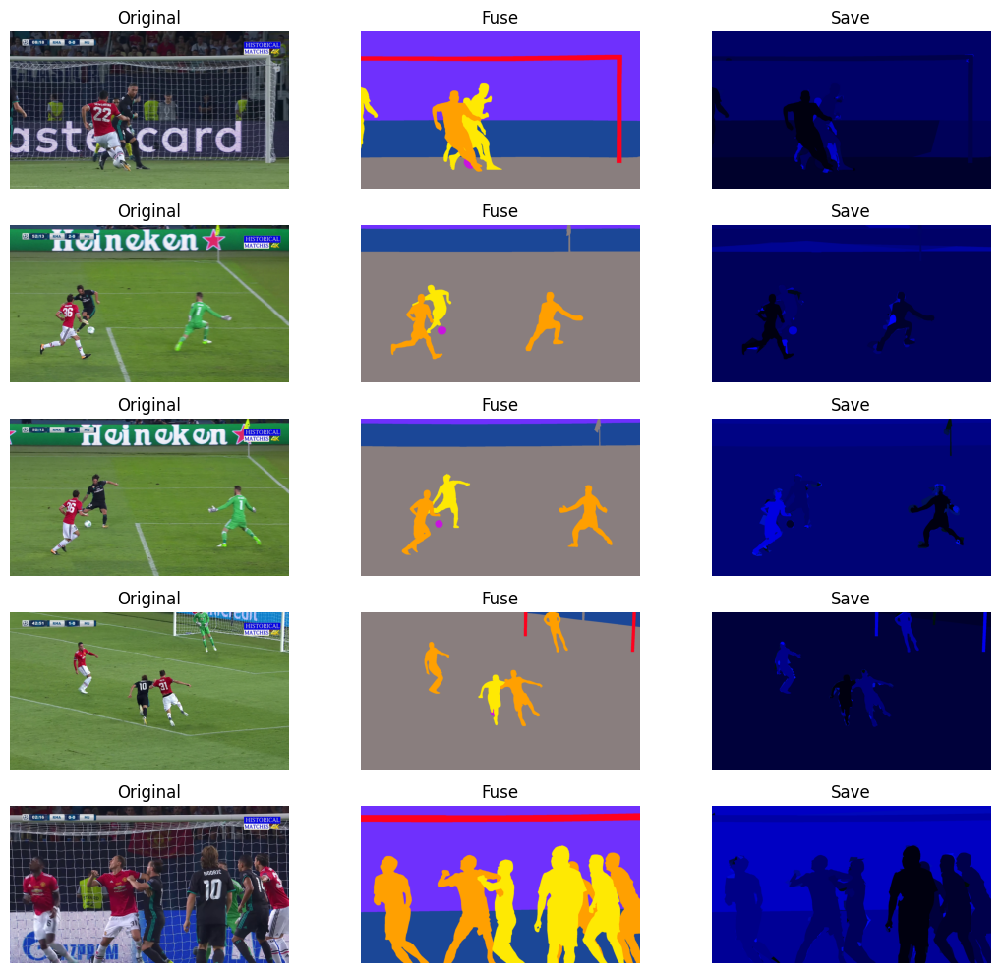

In [11]:
# image pairing and visualization 
num_samples = 5
sample_image_pairs = random.sample(image_pairs, num_samples)

print(f"{len(sample_image_pairs)} samples")

fig, axes, = plt.subplots(num_samples, 3, figsize=(11, 10))

for i, (orig, fuse, save) in enumerate(sample_image_pairs):
    # original image 
    axes[i, 0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original")
    axes[i, 0].axis("off")

    # fuse
    axes[i, 1].imshow(cv2.cvtColor(fuse, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Fuse")
    axes[i, 1].axis("off")

    # save
    axes[i, 2].imshow(cv2.cvtColor(save, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title("Save")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

## 1.2. Mask labeling

In [12]:
# collect unique colors across the entire dataset 
def get_unique_colors(image_folder, mask_files, max_classes=11):
    """
    A function that exports  a unique colors from every mask in the dataset 
     extract unique colors from segmentation mask images

    Args:
        image_folder (str): Directory where the mask images are stored.   
        mask_files (list):A list of filenames corresponding to segmentation masks.
        max_classes (int): the number of classes i.e 11 in this case .

    Returns:
        list:  list pf unique colors (up to max_classes)
    """
    color_set = set()

    for mask_file in mask_files:
        mask_path = os.path.join(image_folder, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        unique_colors, _ = np.unique(mask.reshape(-1, 3), axis=0, return_counts=True)   
        for color in unique_colors:
            if tuple(color) not in color_set:   # add only new colors 
                color_set.add(tuple(color))

                 
                if len(color_set) >= max_classes:
                    return list(color_set)

    return list(color_set)

# collect colors that apperar in all masks 
unique_colors = get_unique_colors(image_folder, fuse_images)
print(f"Unique colors: {len(unique_colors)}")

Unique colors: 11


In [13]:
color_to_label = {color: idx for idx, color in enumerate(unique_colors)}
print(color_to_label)

{(238, 171, 171): 0, (254, 233, 3): 1, (0, 0, 0): 2, (255, 0, 29): 3, (111, 48, 253): 4, (137, 126, 126): 5, (27, 71, 151): 6, (255, 160, 1): 7, (201, 19, 223): 8, (255, 159, 0): 9, (255, 235, 0): 10}


## 1.3 Dataset

In [14]:
class FootballDataset(Dataset):
    def __init__(self, image_files, mask_files, image_folder, color_to_label, transform=None):
        self.image_files = image_files
        self.mask_files = mask_files
        self.image_folder = image_folder
        self.color_to_label = color_to_label  
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_folder, self.image_files[idx])
        mask_path = os.path.join(self.image_folder, self.mask_files[idx])

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        # Transormation branch 
        if self.transform is None:
            img = cv2.resize(img, (256, 256)) / 255.0  # normalization
            img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)  # (H, W, C) → (C, H, W)

            mask = cv2.resize(mask, (256, 256), interpolation=cv2.INTER_NEAREST)
            mask = torch.tensor(mask, dtype=torch.uint8).permute(2, 0, 1)  # (H, W, C) → (C, H, W)
        else:
        
            img = Image(torch.from_numpy(img).permute(2, 0, 1))  # (H, W, C) → (C, H, W)
            mask = Mask(torch.from_numpy(mask).permute(2, 0, 1))  # (H, W, C) → (C, H, W)
            img, mask = self.transform(img, mask)

        # convert classes using color_to_label 
        mask_np = mask.permute(1, 2, 0).numpy()
        mask_class = np.zeros(mask_np.shape[:2], dtype=np.uint8)
        for color, label in self.color_to_label.items():
            mask_class[np.all(mask_np == np.array(color), axis=-1)] = label  # use fixed id 

        #final mask conversion 
        mask = torch.tensor(mask_class, dtype=torch.long)  # (H, W)

        return img, mask

In [15]:
dataset_size = len(original_images)
trainval_size = int(0.9 * dataset_size)  # 90 Train
test_size = dataset_size - trainval_size  # 10 Test

# image and mask pair (img, mask)
paired_files = list(zip(original_images, fuse_images))

#randomly split  trainval/test 
trainval_files, test_files = random_split(paired_files, [trainval_size, test_size])

# randomly split train/val 
val_size = int(1/9 * trainval_size)  
train_size = trainval_size - val_size  
train_files, val_files = random_split(trainval_files, [train_size, val_size])


# separate img/mask files from the split dataset
train_image_files, train_mask_files = zip(*train_files)
val_image_files, val_mask_files = zip(*val_files)
test_image_files, test_mask_files = zip(*test_files)

#check output matching  
print("Checking Train images and masks")
for img, mask in zip(train_image_files, train_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

print("Checking Val images and masks")
for img, mask in zip(val_image_files, val_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

print("Checking Test images and masks")
for img, mask in zip(test_image_files, test_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

Checking Train images and masks
Checking Val images and masks
Checking Test images and masks


### 1.3.1. Dataset without agumentation

In [16]:
 
train_dataset = FootballDataset(train_image_files, train_mask_files, image_folder, color_to_label)
val_dataset = FootballDataset(val_image_files, val_mask_files, image_folder, color_to_label)
test_dataset = FootballDataset(test_image_files, test_mask_files, image_folder, color_to_label)

 
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, drop_last=False)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, drop_last=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=False)

print(f"Train Data: {len(train_dataset)}, Val Data: {len(val_dataset)}, Test Data: {len(test_dataset)}")

for img, mask in train_loader:
    print(f"image size: {img.shape}")
    print(f"mask size: {mask.shape}")
    break

Train Data: 80, Val Data: 10, Test Data: 10
image size: torch.Size([5, 3, 256, 256])
mask size: torch.Size([5, 256, 256])


### 1.3.2. Dataset with agumentation

In [17]:
 
train_transform = v2.Compose([
    v2.RandomHorizontalFlip(p=0.5),  # left right flip
    v2.RandomVerticalFlip(p=0.2),  # up down blank
    v2.RandomRotation(degrees=10),  # 210 degree rotation 
    v2.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0)),  # random crop and then resize 
    v2.ToDtype(torch.float32, scale=True),
])

valtest_transform = v2.Compose([
    v2.Resize((256, 256)),  # resize only 
    v2.ToDtype(torch.float32, scale=True),
])

In [18]:
# agumented  dataset 
train_transformed_dataset = FootballDataset(train_image_files, train_mask_files, image_folder, color_to_label, train_transform)
val_transformedtrain_transformed_dataset = FootballDataset(val_image_files, val_mask_files, image_folder, color_to_label, valtest_transform)
test_transformedtrain_transformed_dataset = FootballDataset(test_image_files, test_mask_files, image_folder, color_to_label, valtest_transform)

train_transformed_loader = DataLoader(train_transformed_dataset, batch_size=5, shuffle=True, drop_last=False)
val_transformed_loader = DataLoader(val_transformedtrain_transformed_dataset, batch_size=5, shuffle=False, drop_last=False)
test_transformed_loader = DataLoader(test_transformedtrain_transformed_dataset, batch_size=1, shuffle=False, drop_last=False)

print(f"Train Data: {len(train_transformed_dataset)}, Val Data: {len(val_transformedtrain_transformed_dataset)}, Test Data: {len(test_transformedtrain_transformed_dataset)}")

for img, mask in train_transformed_loader:
    print(f"image size: {img.shape}")
    print(f"mask size: {mask.shape}")
    break

Train Data: 80, Val Data: 10, Test Data: 10
image size: torch.Size([5, 3, 256, 256])
mask size: torch.Size([5, 256, 256])


#### 1.3.2.1. Agumented visualization

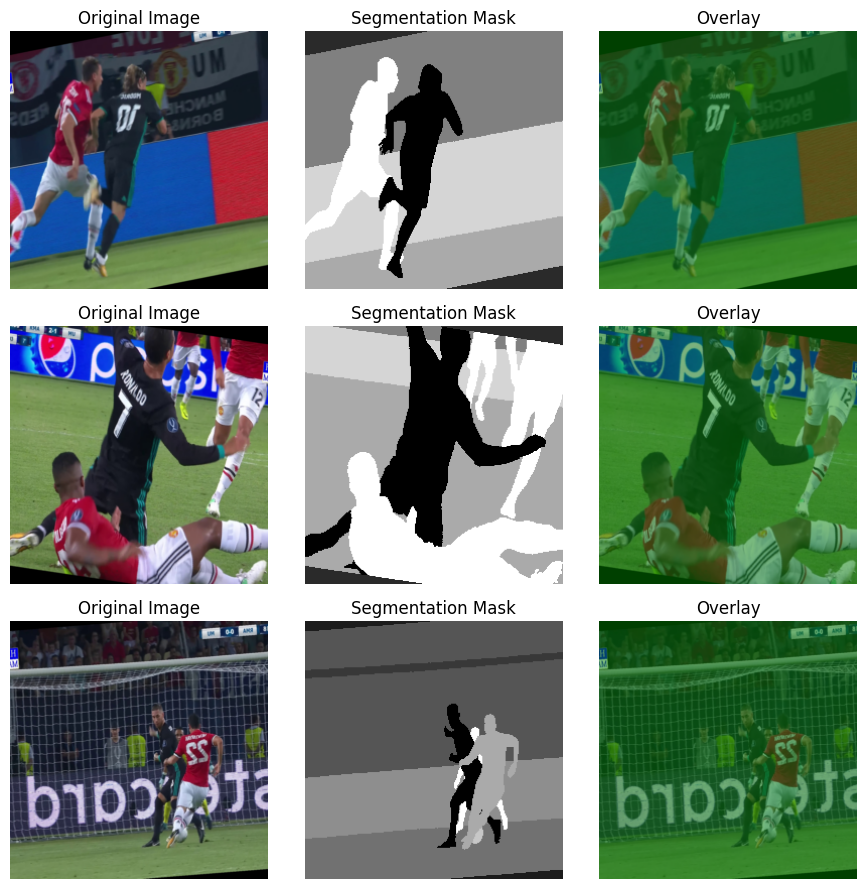

In [19]:
def visualize_samples(loader, num_samples=3):
    data_iter = iter(loader)
    imgs, masks = next(data_iter)  

    fig, axs = plt.subplots(num_samples, 3, figsize=(9, num_samples * 3))  # subplot of size (num_samples, 3) 

    for i in range(num_samples):
        img = imgs[i]
        mask = masks[i]

        # (tv_tensors.Images are usually normalized )
        img = F.to_dtype(img, torch.uint8, scale=True)

        # blur and  Boolean mask to make it visually 
        mask_overlay = draw_segmentation_masks(img, mask.unsqueeze(0).to(torch.bool), colors=["green"], alpha=0.5)

        # original image output 
        axs[i, 0].imshow(img.permute(1, 2, 0).numpy())
        axs[i, 0].set_title("Original Image")
        axs[i, 0].axis("off")

        # mask output (gray scle inversion )
        axs[i, 1].imshow(mask.numpy(), cmap="gray")
        axs[i, 1].set_title("Segmentation Mask")
        axs[i, 1].axis("off")

        #overlayed image output 
        axs[i, 2].imshow(mask_overlay.permute(1, 2, 0).numpy())  
        axs[i, 2].set_title("Overlay")
        axs[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

# check the application of training data 
visualize_samples(train_transformed_loader)

In [20]:
# take a sample dataset and check it 
for img, mask in train_transformed_loader:
    print(f"Image shape: {img.shape}")  
    print(f"Mask shape: {mask.shape}")  
    
  
    print(f"Image min: {img.min()}, max: {img.max()}")  # 0~1

    
    print(f"Unique mask values: {torch.unique(mask)}")  # 0~10

    break  

Image shape: torch.Size([5, 3, 256, 256])
Mask shape: torch.Size([5, 256, 256])
Image min: 0.0, max: 1.0
Unique mask values: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])


# 2.saving and loading models

In [21]:
# preference 
if "COLAB_GPU" in os.environ:
    model_dir = "/content/drive/My Drive/model_storage/"
elif os.path.exists("/kaggle"):
    model_dir = "/kaggle/working/model_storage/"
else:
    model_dir = "./model_storage"


os.makedirs(model_dir, exist_ok=True)
print(f"Now using Model Directory: {model_dir}")


#check model path 
def get_model_path(model_name):
    return os.path.join(model_dir, f"{model_name}.pth")



def save_model(model, model_name, optimizer, scheduler, epoch, best_metric):
    model_path = get_model_path(model_name)
    checkpoint = {
        "model": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        "scheduler": scheduler.state_dict(),
        "epoch": epoch + 1,
        "best_metric": best_metric
    }
    torch.save(checkpoint, model_path)
    print(f"Checkpint Saved: {model_path}, Epoch: {epoch + 1}, Best Metric: {best_metric:.4f}")


# load model
def load_model(model, model_name, optimizer, scheduler):
    """
    return: model.to(device), epoch, best_metrich
    """
    model_path = get_model_path(model_name)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # if oyu dont have all the passes, start over 
    if not os.path.exists(model_path):
        print(f"No Checkpoint Found: {model_path}")
        return model.to(device), 0, float("inf")

    # load model
    checkpoint = torch.load(model_path, map_location=device, weights_only=True)

    model.load_state_dict(checkpoint["model"])
    epoch = checkpoint["epoch"]
    best_metric = checkpoint["best_metric"]
 
    if optimizer is not None:
        optimizer.load_state_dict(checkpoint["optimizer"])
    if scheduler is not None:
        scheduler.load_state_dict(checkpoint["scheduler"])

    print(f"Checkpoint Loaded: {model_path}, Epoch: {epoch}, Best Metric: {best_metric:.4f}")
    return model.to(device), epoch, best_metric



Now using Model Directory: /kaggle/working/model_storage/


# 3.Model training and evalution blocks

In [22]:
train_losses_per_model = {}
val_losses_per_model = {}

def train_model(model, model_name, trainloader, valloader, criterion, optimizer, scheduler, num_epochs):
    model.to(device)
    model, start_epoch, best_metric = load_model(model, model_name, optimizer, scheduler)

    print(f"Start with Epoch={start_epoch}, Best Metric={best_metric}")
    
    global train_losses_per_model, val_losses_per_model
    
    train_losses_per_model[model_name] = []
    val_losses_per_model[model_name] = []
    
    for epoch in range(start_epoch, num_epochs):
        # Training
        model.train()
        train_loss, train_dice =  0, 0
        train_bar = tqdm(trainloader, desc=f"Training {epoch+1}/{num_epochs}")
        for images, masks in train_bar:
            images, masks = images.to(device), masks.to(device)
            masks = torch.clamp(masks, min=0, max=10)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

          
            train_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            
            train_dice += compute_dice(preds, masks, num_classes=11)

            train_bar.set_postfix({"Loss": loss.item()})

        avg_train_loss = train_loss / len(trainloader)
        
        train_losses_per_model[model_name].append(avg_train_loss) 
        
        avg_train_dice = train_dice / len(trainloader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_train_loss:.4f},  Dice score: {avg_train_dice:.4f}")

        # Validation
        model.eval()
        val_loss, val_dice =  0, 0
        val_bar = tqdm(valloader, desc=f"Validation {epoch+1}/{num_epochs}")
        with torch.no_grad():
            for images, masks in val_bar:
                images, masks = images.to(device), masks.to(device)
                masks = torch.clamp(masks, min=0, max=10)

                outputs = model(images)
                loss = criterion(outputs, masks)

                val_loss += loss.item()
                preds = torch.argmax(outputs, dim=1)
                
                
                val_dice += compute_dice(preds, masks, num_classes=11)

                val_bar.set_postfix({"Loss": loss.item()})

        avg_val_loss = val_loss / len(valloader)
        val_losses_per_model[model_name].append(avg_val_loss)
        avg_val_dice = val_dice / len(valloader)
        print(f"Validation Loss: {avg_val_loss:.4f}, Dice score: {avg_val_dice:.4f}\n")

        # Scheduler step
        if scheduler is not None:
            current_lr = optimizer.param_groups[0]['lr']
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(avg_val_loss)
            else:
                scheduler.step()
            updated_lr = optimizer.param_groups[0]['lr']
            if updated_lr != current_lr:
                print(f"Learning Rate Updated: {current_lr:.6f} -> {updated_lr:.6f}")

        # Save model if validation loss improves
        if avg_val_loss < best_metric:
            print(f"Best Validation Metric Updated: {best_metric:.4f} -> {avg_val_loss:.4f}")
            best_metric = avg_val_loss
            save_model(model, model_name, optimizer, scheduler, epoch, best_metric)
    plot_loss_curves(model_name)
    return avg_train_loss,avg_train_dice, avg_val_loss, avg_val_dice

In [23]:

def evaluate_model(model, model_name, testloader, criterion):
   
    model, _, _ = load_model(model, model_name, None, None)
    model.eval()

    # Initialize metrics
    test_loss,test_dice =  0, 0
    test_bar = tqdm(testloader, desc="Testing")

    # Fixed colormap settings (same for GT & predicted masks)
    fixed_colors = list(mcolors.TABLEAU_COLORS.values())  # 10 color items "tab10"
    label_colors = {label: fixed_colors[i % len(fixed_colors)] for i, label in enumerate(range(11))}  # 0~10 classes
    cmap_fixed = mcolors.ListedColormap([label_colors[label] for label in sorted(label_colors.keys())])

    
    plt.figure(figsize=(15, 40))
    plot_index = 1

    with torch.no_grad():
        for images, masks in test_bar:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Compute metrics
            test_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            
            test_dice += compute_dice(preds, masks, num_classes=11)
            # Update progress bar
            test_bar.set_postfix({"Loss": loss.item()})

            # Plotting
            pred_masks = preds.cpu().numpy()  # No need for softmax since argmax is used
            for b in range(images.size(0)):
                # Original Image
                plt.subplot(10, 3, plot_index)
                plt.imshow(images[b].cpu().permute(1, 2, 0).numpy())  # Ensure correct tensor shape
                plt.title("Original Image")
                plt.axis("off")
                plot_index += 1

                # Ground Truth Mask
                plt.subplot(10, 3, plot_index)
                plt.imshow(masks[b].cpu().numpy(), cmap=cmap_fixed, vmin=0, vmax=10)
                plt.title("Ground Truth Mask")
                plt.axis("off")
                plot_index += 1

                # Predicted Mask
                plt.subplot(10, 3, plot_index)
                plt.imshow(pred_masks[b], cmap=cmap_fixed, vmin=0, vmax=10)
                plt.title("Predicted Mask")
                plt.axis("off")
                plot_index += 1

                if plot_index > 10 * 3:  # Visualize up to 10 images
                    break
            if plot_index > 10 * 3:
                break

    # Compute average metrics
    avg_test_loss = test_loss / len(testloader)
   
    avg_test_dice = test_dice / len(testloader)

    # Print results
    print(f"Test Loss: {avg_test_loss:.4f}, Dice Score: {avg_test_dice:.4f}")

    # Display plots
    plt.tight_layout()
    plt.show()

In [24]:
def plot_loss_curves(model_name):
    """
    Plots training and validation loss curves after training a single model.
    """
    plt.figure(figsize=(8, 5))

    epochs = range(1, len(train_losses_per_model[model_name]) + 1)
    plt.plot(epochs, train_losses_per_model[model_name], label="Train Loss", marker="o")
    plt.plot(epochs, val_losses_per_model[model_name], label="Val Loss", marker="o", linestyle="dashed")

    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"Loss Curve for {model_name}")
    plt.legend()
    plt.grid(True)
    plt.show()



## 3.1 Loss Function

1. Focal Loss
    - An improved version of  Cross Entropy Loss
    - introduced to solve class imbalance problem 
    - giving a greater weight to difficult samples than to easy samples encourage the model to learn more about difficult samples.
2. Dice Loss
    - Segmentation Loss,mainly used in imbalanced data 
    - maximize similarity between pixels in a similar way to IoU(Intersection over Union)
    - To better learn classes with small objects or a small number of pixels.

3. Hybrid Loss(Focal Loss + Dice Loss)
    - Let's combine the two losses in a 50:50 ratio induce balanced learning.

In [25]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, inputs, targets):
        ce_loss = self.ce_loss(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()


class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6, num_classes=11):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        self.num_classes = num_classes  # set number of classes 

    def forward(self, inputs, targets):
        # Logits →probability transformation (softmax)
        inputs = torch.softmax(inputs, dim=1)

        # convert targets to One-Hot Encoding (batch_size, height, width) → (batch_size, num_classes, height, width)
        targets = torch.nn.functional.one_hot(targets, num_classes=self.num_classes).permute(0, 3, 1, 2).float()

        # Dice Loss calculations 
        intersection = (inputs * targets).sum(dim=(2, 3))  # intersection of each class 
        dice_score = (2. * intersection + self.smooth) / (inputs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3)) + self.smooth)
        return 1 - dice_score.mean()  # convert Dice Score to  Loss


class HybridLoss(nn.Module):
    def __init__(self, alpha=0.5, num_classes=11):
        super(HybridLoss, self).__init__()
        self.focal = FocalLoss()
        self.dice = DiceLoss(num_classes=num_classes)
        self.alpha = alpha  # Focal Loss weight

    def forward(self, inputs, targets):
        return self.alpha * self.focal(inputs, targets) + (1 - self.alpha) * self.dice(inputs, targets)

In [26]:
def compute_dice(preds, masks, num_classes=11):
    dice_scores = []
    for c in range(num_classes):
        pred_c = (preds == c).float()  # Binary mask for class c in predictions
        mask_c = (masks == c).float()  # Binary mask for class c in ground truth
        intersection = (pred_c * mask_c).sum()
        union = pred_c.sum() + mask_c.sum() + 1e-6
        if union > 1e-6:  # Skip if no pixels for this class
            dice = 2 * intersection / union
            dice_scores.append(dice)
    return torch.tensor(dice_scores).mean().item() if dice_scores else 0.0

# 4.Models

## 4.1. Baseline UNet

In [27]:
# Define U-Net model  ( added BatchNorm )
class UNet(nn.Module):
    def __init__(self, num_classes=11):
        super(UNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),  # BatchNorm added 
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),  # BatchNorm added 
                nn.ReLU(inplace=True),
            )

        self.encoder1 = conv_block(3, 64)
        self.encoder2 = conv_block(64, 128)
        self.encoder3 = conv_block(128, 256)
        self.encoder4 = conv_block(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = conv_block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        # encoding 
        e1 = self.encoder1(x)               # (batch, 64, H, W)
        e2 = self.encoder2(self.pool(e1))   # (batch, 128, H/2, W/2)
        e3 = self.encoder3(self.pool(e2))   # (batch, 256, H/4, W/4)
        e4 = self.encoder4(self.pool(e3))   # (batch, 512, H/8, W/8)

        # bottleneck 
        b = self.bottleneck(self.pool(e4))  # (batch, 1024, H/16, W/16)

        # decoding 
        d4 = self.upconv4(b)                # (batch, 512, H/8, W/8)
        d4 = torch.cat((d4, e4), dim=1)     # (batch, 1024, H/8, W/8)
        d4 = self.decoder4(d4)              # (batch, 512, H/8, W/8)

        d3 = self.upconv3(d4)               # (batch, 256, H/4, W/4)
        d3 = torch.cat((d3, e3), dim=1)     # (batch, 512, H/4, W/4)
        d3 = self.decoder3(d3)              # (batch, 256, H/4, W/4)

        d2 = self.upconv2(d3)               # (batch, 128, H/2, W/2)
        d2 = torch.cat((d2, e2), dim=1)     # (batch, 256, H/2, W/2)
        d2 = self.decoder2(d2)              # (batch, 128, H/2, W/2)

        d1 = self.upconv1(d2)               # (batch, 64, H, W)
        d1 = torch.cat((d1, e1), dim=1)     # (batch, 128, H, W)
        d1 = self.decoder1(d1)              # (batch, 64, H, W)

        return self.final_conv(d1)          # (batch, num_classes, H, W)

No Checkpoint Found: /kaggle/working/model_storage/Baseline_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:07<00:00,  2.12it/s, Loss=0.436]


Epoch [1/100], Loss: 0.4953,  Dice score: 0.2432


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.499]


Validation Loss: 0.4803, Dice score: 0.2377

Learning Rate Updated: 0.005000 -> 0.004999
Best Validation Metric Updated: inf -> 0.4803
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 1, Best Metric: 0.4803


Training 2/100: 100%|██████████| 16/16 [00:06<00:00,  2.42it/s, Loss=0.414]


Epoch [2/100], Loss: 0.4242,  Dice score: 0.2881


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.449]


Validation Loss: 0.4408, Dice score: 0.2523

Learning Rate Updated: 0.004999 -> 0.004995
Best Validation Metric Updated: 0.4803 -> 0.4408
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 2, Best Metric: 0.4408


Training 3/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.395]


Epoch [3/100], Loss: 0.4034,  Dice score: 0.2974


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.419]


Validation Loss: 0.4096, Dice score: 0.2989

Learning Rate Updated: 0.004995 -> 0.004989
Best Validation Metric Updated: 0.4408 -> 0.4096
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 3, Best Metric: 0.4096


Training 4/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.388]


Epoch [4/100], Loss: 0.3992,  Dice score: 0.3289


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.41]


Validation Loss: 0.4079, Dice score: 0.3093

Learning Rate Updated: 0.004989 -> 0.004980
Best Validation Metric Updated: 0.4096 -> 0.4079
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 4, Best Metric: 0.4079


Training 5/100: 100%|██████████| 16/16 [00:06<00:00,  2.42it/s, Loss=0.379]


Epoch [5/100], Loss: 0.3791,  Dice score: 0.4055


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.414]


Validation Loss: 0.4095, Dice score: 0.3392

Learning Rate Updated: 0.004980 -> 0.004969


Training 6/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.348]


Epoch [6/100], Loss: 0.3637,  Dice score: 0.4496


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.861]


Validation Loss: 0.8136, Dice score: 0.2524

Learning Rate Updated: 0.004969 -> 0.004956


Training 7/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.363]


Epoch [7/100], Loss: 0.3518,  Dice score: 0.4678


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.39]


Validation Loss: 0.3768, Dice score: 0.3993

Learning Rate Updated: 0.004956 -> 0.004940
Best Validation Metric Updated: 0.4079 -> 0.3768
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 7, Best Metric: 0.3768


Training 8/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.376]


Epoch [8/100], Loss: 0.3416,  Dice score: 0.4940


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.376]


Validation Loss: 0.3719, Dice score: 0.4387

Learning Rate Updated: 0.004940 -> 0.004921
Best Validation Metric Updated: 0.3768 -> 0.3719
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 8, Best Metric: 0.3719


Training 9/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.327]


Epoch [9/100], Loss: 0.3266,  Dice score: 0.5248


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.353]


Validation Loss: 0.3488, Dice score: 0.4990

Learning Rate Updated: 0.004921 -> 0.004901
Best Validation Metric Updated: 0.3719 -> 0.3488
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 9, Best Metric: 0.3488


Training 10/100: 100%|██████████| 16/16 [00:06<00:00,  2.38it/s, Loss=0.332]


Epoch [10/100], Loss: 0.3298,  Dice score: 0.5245


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.39]


Validation Loss: 0.3821, Dice score: 0.3968

Learning Rate Updated: 0.004901 -> 0.004878


Training 11/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.298]


Epoch [11/100], Loss: 0.3177,  Dice score: 0.5513


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.365]


Validation Loss: 0.3512, Dice score: 0.4770

Learning Rate Updated: 0.004878 -> 0.004852


Training 12/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.294]


Epoch [12/100], Loss: 0.3066,  Dice score: 0.5737


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.408]


Validation Loss: 0.3917, Dice score: 0.3969

Learning Rate Updated: 0.004852 -> 0.004824


Training 13/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.307]


Epoch [13/100], Loss: 0.3126,  Dice score: 0.5692


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.326]


Validation Loss: 0.3249, Dice score: 0.5724

Learning Rate Updated: 0.004824 -> 0.004794
Best Validation Metric Updated: 0.3488 -> 0.3249
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 13, Best Metric: 0.3249


Training 14/100: 100%|██████████| 16/16 [00:06<00:00,  2.38it/s, Loss=0.312]


Epoch [14/100], Loss: 0.3094,  Dice score: 0.5913


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.468]


Validation Loss: 0.4533, Dice score: 0.4209

Learning Rate Updated: 0.004794 -> 0.004762


Training 15/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.291]


Epoch [15/100], Loss: 0.3046,  Dice score: 0.6030


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.338]


Validation Loss: 0.3282, Dice score: 0.5363

Learning Rate Updated: 0.004762 -> 0.004728


Training 16/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.282]


Epoch [16/100], Loss: 0.2926,  Dice score: 0.5995


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.307]


Validation Loss: 0.3075, Dice score: 0.5999

Learning Rate Updated: 0.004728 -> 0.004691
Best Validation Metric Updated: 0.3249 -> 0.3075
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 16, Best Metric: 0.3075


Training 17/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.3]


Epoch [17/100], Loss: 0.2838,  Dice score: 0.6192


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.344]


Validation Loss: 0.3335, Dice score: 0.5347

Learning Rate Updated: 0.004691 -> 0.004652


Training 18/100: 100%|██████████| 16/16 [00:06<00:00,  2.42it/s, Loss=0.284]


Epoch [18/100], Loss: 0.2751,  Dice score: 0.6548


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.303]


Validation Loss: 0.3030, Dice score: 0.6245

Learning Rate Updated: 0.004652 -> 0.004611
Best Validation Metric Updated: 0.3075 -> 0.3030
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 18, Best Metric: 0.3030


Training 19/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.268]


Epoch [19/100], Loss: 0.2718,  Dice score: 0.6469


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.307]


Validation Loss: 0.3015, Dice score: 0.6200

Learning Rate Updated: 0.004611 -> 0.004568
Best Validation Metric Updated: 0.3030 -> 0.3015
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 19, Best Metric: 0.3015


Training 20/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.275]


Epoch [20/100], Loss: 0.2722,  Dice score: 0.6570


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.271]


Validation Loss: 0.2742, Dice score: 0.7046

Learning Rate Updated: 0.004568 -> 0.004523
Best Validation Metric Updated: 0.3015 -> 0.2742
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 20, Best Metric: 0.2742


Training 21/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.247]


Epoch [21/100], Loss: 0.2625,  Dice score: 0.6749


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.312]


Validation Loss: 0.3060, Dice score: 0.6129

Learning Rate Updated: 0.004523 -> 0.004475


Training 22/100: 100%|██████████| 16/16 [00:06<00:00,  2.41it/s, Loss=0.25]


Epoch [22/100], Loss: 0.2625,  Dice score: 0.6839


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.326]


Validation Loss: 0.3228, Dice score: 0.5906

Learning Rate Updated: 0.004475 -> 0.004426


Training 23/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.258]


Epoch [23/100], Loss: 0.2661,  Dice score: 0.6659


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.312]


Validation Loss: 0.3062, Dice score: 0.5982

Learning Rate Updated: 0.004426 -> 0.004375


Training 24/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.259]


Epoch [24/100], Loss: 0.2658,  Dice score: 0.6678


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.301]


Validation Loss: 0.2985, Dice score: 0.6475

Learning Rate Updated: 0.004375 -> 0.004323


Training 25/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.238]


Epoch [25/100], Loss: 0.2659,  Dice score: 0.6712


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.323]


Validation Loss: 0.3258, Dice score: 0.5608

Learning Rate Updated: 0.004323 -> 0.004268


Training 26/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.323]


Epoch [26/100], Loss: 0.2612,  Dice score: 0.6825


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.295]


Validation Loss: 0.2966, Dice score: 0.6321

Learning Rate Updated: 0.004268 -> 0.004212


Training 27/100: 100%|██████████| 16/16 [00:06<00:00,  2.41it/s, Loss=0.273]


Epoch [27/100], Loss: 0.2605,  Dice score: 0.6794


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.333]


Validation Loss: 0.3231, Dice score: 0.5543

Learning Rate Updated: 0.004212 -> 0.004153


Training 28/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.256]


Epoch [28/100], Loss: 0.2564,  Dice score: 0.6831


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.325]


Validation Loss: 0.3285, Dice score: 0.5900

Learning Rate Updated: 0.004153 -> 0.004094


Training 29/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.243]


Epoch [29/100], Loss: 0.2484,  Dice score: 0.7116


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.261]


Validation Loss: 0.2641, Dice score: 0.7283

Learning Rate Updated: 0.004094 -> 0.004032
Best Validation Metric Updated: 0.2742 -> 0.2641
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 29, Best Metric: 0.2641


Training 30/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.246]


Epoch [30/100], Loss: 0.2516,  Dice score: 0.6853


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.296]


Validation Loss: 0.3032, Dice score: 0.6111

Learning Rate Updated: 0.004032 -> 0.003970


Training 31/100: 100%|██████████| 16/16 [00:06<00:00,  2.41it/s, Loss=0.259]


Epoch [31/100], Loss: 0.2570,  Dice score: 0.6700


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.27]


Validation Loss: 0.2732, Dice score: 0.6602

Learning Rate Updated: 0.003970 -> 0.003905


Training 32/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.225]


Epoch [32/100], Loss: 0.2516,  Dice score: 0.7053


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.256]


Validation Loss: 0.2655, Dice score: 0.7084

Learning Rate Updated: 0.003905 -> 0.003840


Training 33/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.246]


Epoch [33/100], Loss: 0.2487,  Dice score: 0.7172


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.291]


Validation Loss: 0.2937, Dice score: 0.6510

Learning Rate Updated: 0.003840 -> 0.003773


Training 34/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.234]


Epoch [34/100], Loss: 0.2496,  Dice score: 0.6986


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.27]


Validation Loss: 0.2693, Dice score: 0.6901

Learning Rate Updated: 0.003773 -> 0.003705


Training 35/100: 100%|██████████| 16/16 [00:06<00:00,  2.41it/s, Loss=0.23]


Epoch [35/100], Loss: 0.2465,  Dice score: 0.7132


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.265]


Validation Loss: 0.2700, Dice score: 0.7224

Learning Rate Updated: 0.003705 -> 0.003635


Training 36/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.215]


Epoch [36/100], Loss: 0.2459,  Dice score: 0.7175


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.263]


Validation Loss: 0.2663, Dice score: 0.6963

Learning Rate Updated: 0.003635 -> 0.003565


Training 37/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.236]


Epoch [37/100], Loss: 0.2407,  Dice score: 0.7292


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.267]


Validation Loss: 0.2744, Dice score: 0.6976

Learning Rate Updated: 0.003565 -> 0.003493


Training 38/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.223]


Epoch [38/100], Loss: 0.2395,  Dice score: 0.7376


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.247]


Validation Loss: 0.2545, Dice score: 0.7351

Learning Rate Updated: 0.003493 -> 0.003421
Best Validation Metric Updated: 0.2641 -> 0.2545
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 38, Best Metric: 0.2545


Training 39/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.244]


Epoch [39/100], Loss: 0.2385,  Dice score: 0.7329


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.236]


Validation Loss: 0.2447, Dice score: 0.7617

Learning Rate Updated: 0.003421 -> 0.003347
Best Validation Metric Updated: 0.2545 -> 0.2447
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 39, Best Metric: 0.2447


Training 40/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.247]


Epoch [40/100], Loss: 0.2453,  Dice score: 0.7258


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.276]


Validation Loss: 0.2766, Dice score: 0.6759

Learning Rate Updated: 0.003347 -> 0.003273


Training 41/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.296]


Epoch [41/100], Loss: 0.2378,  Dice score: 0.7451


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.245]


Validation Loss: 0.2502, Dice score: 0.7516

Learning Rate Updated: 0.003273 -> 0.003198


Training 42/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.241]


Epoch [42/100], Loss: 0.2358,  Dice score: 0.7235


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.247]


Validation Loss: 0.2505, Dice score: 0.7521

Learning Rate Updated: 0.003198 -> 0.003122


Training 43/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.206]


Epoch [43/100], Loss: 0.2351,  Dice score: 0.7344


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.235]


Validation Loss: 0.2450, Dice score: 0.7524

Learning Rate Updated: 0.003122 -> 0.003046


Training 44/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.28]


Epoch [44/100], Loss: 0.2351,  Dice score: 0.7467


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.251]


Validation Loss: 0.2563, Dice score: 0.7196

Learning Rate Updated: 0.003046 -> 0.002969


Training 45/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.22]


Epoch [45/100], Loss: 0.2324,  Dice score: 0.7431


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.255]


Validation Loss: 0.2566, Dice score: 0.7532

Learning Rate Updated: 0.002969 -> 0.002892


Training 46/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.221]


Epoch [46/100], Loss: 0.2286,  Dice score: 0.7722


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.226]


Validation Loss: 0.2385, Dice score: 0.7889

Learning Rate Updated: 0.002892 -> 0.002814
Best Validation Metric Updated: 0.2447 -> 0.2385
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 46, Best Metric: 0.2385


Training 47/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.229]


Epoch [47/100], Loss: 0.2243,  Dice score: 0.7830


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.228]


Validation Loss: 0.2374, Dice score: 0.7923

Learning Rate Updated: 0.002814 -> 0.002736
Best Validation Metric Updated: 0.2385 -> 0.2374
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 47, Best Metric: 0.2374


Training 48/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.251]


Epoch [48/100], Loss: 0.2217,  Dice score: 0.7724


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.244]


Validation Loss: 0.2534, Dice score: 0.7457

Learning Rate Updated: 0.002736 -> 0.002657


Training 49/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.221]


Epoch [49/100], Loss: 0.2236,  Dice score: 0.7902


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.222]


Validation Loss: 0.2378, Dice score: 0.7716

Learning Rate Updated: 0.002657 -> 0.002579


Training 50/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.248]


Epoch [50/100], Loss: 0.2256,  Dice score: 0.7838


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.241]


Validation Loss: 0.2498, Dice score: 0.7418

Learning Rate Updated: 0.002579 -> 0.002501


Training 51/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.258]


Epoch [51/100], Loss: 0.2262,  Dice score: 0.7858


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.232]


Validation Loss: 0.2425, Dice score: 0.7937

Learning Rate Updated: 0.002501 -> 0.002422


Training 52/100: 100%|██████████| 16/16 [00:06<00:00,  2.42it/s, Loss=0.211]


Epoch [52/100], Loss: 0.2209,  Dice score: 0.7932


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.228]


Validation Loss: 0.2383, Dice score: 0.7704

Learning Rate Updated: 0.002422 -> 0.002344


Training 53/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.207]


Epoch [53/100], Loss: 0.2237,  Dice score: 0.7902


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.259]


Validation Loss: 0.2622, Dice score: 0.7235

Learning Rate Updated: 0.002344 -> 0.002265


Training 54/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.211]


Epoch [54/100], Loss: 0.2242,  Dice score: 0.7685


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.237]


Validation Loss: 0.2462, Dice score: 0.7736

Learning Rate Updated: 0.002265 -> 0.002187


Training 55/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.22]


Epoch [55/100], Loss: 0.2255,  Dice score: 0.7600


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.262]


Validation Loss: 0.2755, Dice score: 0.6768

Learning Rate Updated: 0.002187 -> 0.002109


Training 56/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.179]


Epoch [56/100], Loss: 0.2223,  Dice score: 0.7911


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.216]


Validation Loss: 0.2283, Dice score: 0.7995

Learning Rate Updated: 0.002109 -> 0.002032
Best Validation Metric Updated: 0.2374 -> 0.2283
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 56, Best Metric: 0.2283


Training 57/100: 100%|██████████| 16/16 [00:06<00:00,  2.38it/s, Loss=0.231]


Epoch [57/100], Loss: 0.2183,  Dice score: 0.7883


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.217]


Validation Loss: 0.2290, Dice score: 0.8130

Learning Rate Updated: 0.002032 -> 0.001955


Training 58/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.259]


Epoch [58/100], Loss: 0.2222,  Dice score: 0.7900


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.226]


Validation Loss: 0.2355, Dice score: 0.7718

Learning Rate Updated: 0.001955 -> 0.001879


Training 59/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.19]


Epoch [59/100], Loss: 0.2190,  Dice score: 0.8032


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.235]


Validation Loss: 0.2411, Dice score: 0.7785

Learning Rate Updated: 0.001879 -> 0.001803


Training 60/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.21]


Epoch [60/100], Loss: 0.2187,  Dice score: 0.7828


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.222]


Validation Loss: 0.2345, Dice score: 0.8041

Learning Rate Updated: 0.001803 -> 0.001728


Training 61/100: 100%|██████████| 16/16 [00:06<00:00,  2.39it/s, Loss=0.269]


Epoch [61/100], Loss: 0.2170,  Dice score: 0.8098


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.218]


Validation Loss: 0.2292, Dice score: 0.8018

Learning Rate Updated: 0.001728 -> 0.001654


Training 62/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.226]


Epoch [62/100], Loss: 0.2153,  Dice score: 0.8034


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.221]


Validation Loss: 0.2293, Dice score: 0.8127

Learning Rate Updated: 0.001654 -> 0.001580


Training 63/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.208]


Epoch [63/100], Loss: 0.2115,  Dice score: 0.8216


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.223]


Validation Loss: 0.2344, Dice score: 0.8153

Learning Rate Updated: 0.001580 -> 0.001508


Training 64/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.222]


Epoch [64/100], Loss: 0.2121,  Dice score: 0.7997


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.219]


Validation Loss: 0.2290, Dice score: 0.8210

Learning Rate Updated: 0.001508 -> 0.001436


Training 65/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.215]


Epoch [65/100], Loss: 0.2134,  Dice score: 0.7920


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.243]


Validation Loss: 0.2474, Dice score: 0.7673

Learning Rate Updated: 0.001436 -> 0.001366


Training 66/100: 100%|██████████| 16/16 [00:06<00:00,  2.40it/s, Loss=0.194]


Epoch [66/100], Loss: 0.2131,  Dice score: 0.8296


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.215]


Validation Loss: 0.2272, Dice score: 0.8187

Learning Rate Updated: 0.001366 -> 0.001296
Best Validation Metric Updated: 0.2283 -> 0.2272
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 66, Best Metric: 0.2272


Training 67/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.211]


Epoch [67/100], Loss: 0.2102,  Dice score: 0.8144


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.207]


Validation Loss: 0.2201, Dice score: 0.8322

Learning Rate Updated: 0.001296 -> 0.001228
Best Validation Metric Updated: 0.2272 -> 0.2201
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 67, Best Metric: 0.2201


Training 68/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.2]


Epoch [68/100], Loss: 0.2095,  Dice score: 0.8190


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.209]


Validation Loss: 0.2212, Dice score: 0.8261

Learning Rate Updated: 0.001228 -> 0.001161


Training 69/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.212]


Epoch [69/100], Loss: 0.2073,  Dice score: 0.8242


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.204]


Validation Loss: 0.2180, Dice score: 0.8361

Learning Rate Updated: 0.001161 -> 0.001096
Best Validation Metric Updated: 0.2201 -> 0.2180
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 69, Best Metric: 0.2180


Training 70/100: 100%|██████████| 16/16 [00:06<00:00,  2.41it/s, Loss=0.198]


Epoch [70/100], Loss: 0.2072,  Dice score: 0.8349


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.219]


Validation Loss: 0.2257, Dice score: 0.8310

Learning Rate Updated: 0.001096 -> 0.001031


Training 71/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.187]


Epoch [71/100], Loss: 0.2070,  Dice score: 0.8527


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.205]


Validation Loss: 0.2180, Dice score: 0.8401

Learning Rate Updated: 0.001031 -> 0.000969
Best Validation Metric Updated: 0.2180 -> 0.2180
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 71, Best Metric: 0.2180


Training 72/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.218]


Epoch [72/100], Loss: 0.2063,  Dice score: 0.8128


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.21]


Validation Loss: 0.2216, Dice score: 0.8327

Learning Rate Updated: 0.000969 -> 0.000907


Training 73/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.182]


Epoch [73/100], Loss: 0.2071,  Dice score: 0.8427


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.208]


Validation Loss: 0.2205, Dice score: 0.8312

Learning Rate Updated: 0.000907 -> 0.000848


Training 74/100: 100%|██████████| 16/16 [00:06<00:00,  2.40it/s, Loss=0.183]


Epoch [74/100], Loss: 0.2079,  Dice score: 0.8286


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.21]


Validation Loss: 0.2241, Dice score: 0.8137

Learning Rate Updated: 0.000848 -> 0.000789


Training 75/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.22]


Epoch [75/100], Loss: 0.2065,  Dice score: 0.8335


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.209]


Validation Loss: 0.2205, Dice score: 0.8328

Learning Rate Updated: 0.000789 -> 0.000733


Training 76/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.197]


Epoch [76/100], Loss: 0.2047,  Dice score: 0.8423


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.203]


Validation Loss: 0.2170, Dice score: 0.8384

Learning Rate Updated: 0.000733 -> 0.000678
Best Validation Metric Updated: 0.2180 -> 0.2170
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 76, Best Metric: 0.2170


Training 77/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.229]


Epoch [77/100], Loss: 0.2039,  Dice score: 0.8506


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.204]


Validation Loss: 0.2180, Dice score: 0.8403

Learning Rate Updated: 0.000678 -> 0.000626


Training 78/100: 100%|██████████| 16/16 [00:06<00:00,  2.37it/s, Loss=0.186]


Epoch [78/100], Loss: 0.2033,  Dice score: 0.8345


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.206]


Validation Loss: 0.2187, Dice score: 0.8380

Learning Rate Updated: 0.000626 -> 0.000575


Training 79/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.226]


Epoch [79/100], Loss: 0.2036,  Dice score: 0.8242


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.207]


Validation Loss: 0.2185, Dice score: 0.8367

Learning Rate Updated: 0.000575 -> 0.000526


Training 80/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.217]


Epoch [80/100], Loss: 0.2028,  Dice score: 0.8424


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.203]


Validation Loss: 0.2179, Dice score: 0.8358

Learning Rate Updated: 0.000526 -> 0.000478


Training 81/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.232]


Epoch [81/100], Loss: 0.2033,  Dice score: 0.8510


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.203]


Validation Loss: 0.2162, Dice score: 0.8395

Learning Rate Updated: 0.000478 -> 0.000433
Best Validation Metric Updated: 0.2170 -> 0.2162
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 81, Best Metric: 0.2162


Training 82/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.196]


Epoch [82/100], Loss: 0.2021,  Dice score: 0.8498


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.204]


Validation Loss: 0.2165, Dice score: 0.8430

Learning Rate Updated: 0.000433 -> 0.000390


Training 83/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.203]


Epoch [83/100], Loss: 0.2022,  Dice score: 0.8395


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.205]


Validation Loss: 0.2172, Dice score: 0.8376

Learning Rate Updated: 0.000390 -> 0.000349


Training 84/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.194]


Epoch [84/100], Loss: 0.2016,  Dice score: 0.8592


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.204]


Validation Loss: 0.2164, Dice score: 0.8465

Learning Rate Updated: 0.000349 -> 0.000310


Training 85/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.222]


Epoch [85/100], Loss: 0.2011,  Dice score: 0.8516


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.203]


Validation Loss: 0.2160, Dice score: 0.8447

Learning Rate Updated: 0.000310 -> 0.000273
Best Validation Metric Updated: 0.2162 -> 0.2160
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 85, Best Metric: 0.2160


Training 86/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.22]


Epoch [86/100], Loss: 0.2010,  Dice score: 0.8472


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.202]


Validation Loss: 0.2154, Dice score: 0.8443

Learning Rate Updated: 0.000273 -> 0.000239
Best Validation Metric Updated: 0.2160 -> 0.2154
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 86, Best Metric: 0.2154


Training 87/100: 100%|██████████| 16/16 [00:06<00:00,  2.42it/s, Loss=0.196]


Epoch [87/100], Loss: 0.2005,  Dice score: 0.8517


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.205]


Validation Loss: 0.2168, Dice score: 0.8419

Learning Rate Updated: 0.000239 -> 0.000207


Training 88/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.225]


Epoch [88/100], Loss: 0.2006,  Dice score: 0.8606


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.201]


Validation Loss: 0.2148, Dice score: 0.8409

Learning Rate Updated: 0.000207 -> 0.000177
Best Validation Metric Updated: 0.2154 -> 0.2148
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 88, Best Metric: 0.2148


Training 89/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.204]


Epoch [89/100], Loss: 0.2005,  Dice score: 0.8627


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.202]


Validation Loss: 0.2154, Dice score: 0.8430

Learning Rate Updated: 0.000177 -> 0.000149


Training 90/100: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s, Loss=0.206]


Epoch [90/100], Loss: 0.1999,  Dice score: 0.8500


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.202]


Validation Loss: 0.2153, Dice score: 0.8459

Learning Rate Updated: 0.000149 -> 0.000123


Training 91/100: 100%|██████████| 16/16 [00:06<00:00,  2.42it/s, Loss=0.174]


Epoch [91/100], Loss: 0.1993,  Dice score: 0.8431


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.203]


Validation Loss: 0.2154, Dice score: 0.8457

Learning Rate Updated: 0.000123 -> 0.000100


Training 92/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.188]


Epoch [92/100], Loss: 0.1999,  Dice score: 0.8417


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.203]


Validation Loss: 0.2158, Dice score: 0.8449

Learning Rate Updated: 0.000100 -> 0.000080


Training 93/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.232]


Epoch [93/100], Loss: 0.2017,  Dice score: 0.8452


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.202]


Validation Loss: 0.2150, Dice score: 0.8445

Learning Rate Updated: 0.000080 -> 0.000061


Training 94/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.202]


Epoch [94/100], Loss: 0.1997,  Dice score: 0.8595


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.202]


Validation Loss: 0.2152, Dice score: 0.8448

Learning Rate Updated: 0.000061 -> 0.000045


Training 95/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.209]


Epoch [95/100], Loss: 0.1989,  Dice score: 0.8782


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.202]


Validation Loss: 0.2152, Dice score: 0.8455

Learning Rate Updated: 0.000045 -> 0.000032


Training 96/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.204]


Epoch [96/100], Loss: 0.1994,  Dice score: 0.8424


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.201]


Validation Loss: 0.2150, Dice score: 0.8460

Learning Rate Updated: 0.000032 -> 0.000021


Training 97/100: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s, Loss=0.182]


Epoch [97/100], Loss: 0.1989,  Dice score: 0.8685


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.202]


Validation Loss: 0.2153, Dice score: 0.8455

Learning Rate Updated: 0.000021 -> 0.000012


Training 98/100: 100%|██████████| 16/16 [00:06<00:00,  2.46it/s, Loss=0.214]


Epoch [98/100], Loss: 0.1993,  Dice score: 0.8676


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.201]


Validation Loss: 0.2148, Dice score: 0.8455

Learning Rate Updated: 0.000012 -> 0.000006


Training 99/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.2]


Epoch [99/100], Loss: 0.2005,  Dice score: 0.8417


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.202]


Validation Loss: 0.2153, Dice score: 0.8448

Learning Rate Updated: 0.000006 -> 0.000002


Training 100/100: 100%|██████████| 16/16 [00:06<00:00,  2.43it/s, Loss=0.246]


Epoch [100/100], Loss: 0.1988,  Dice score: 0.8760


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.202]

Validation Loss: 0.2154, Dice score: 0.8447

Learning Rate Updated: 0.000002 -> 0.000001


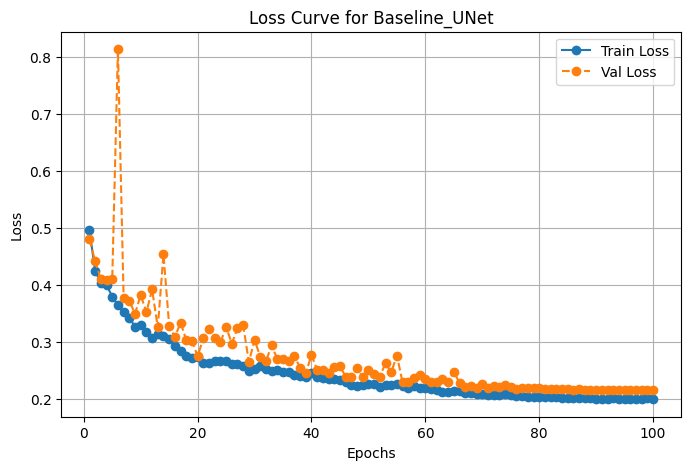

Checkpoint Loaded: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 88, Best Metric: 0.2148


Testing:  90%|█████████ | 9/10 [00:01<00:00,  6.18it/s, Loss=0.248]


Test Loss: 0.2094, Dice Score: 0.6561


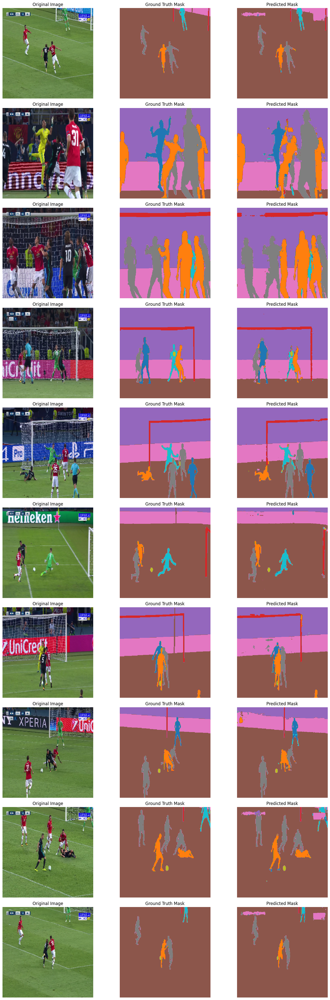

In [28]:
model = UNet(num_classes=11).to(device)
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(model.parameters(), lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
train_model(model, "Baseline_UNet", train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(model, "Baseline_UNet", test_loader, criterion)

 here chaged CrossEntropyLoss  to hy hybrid loss .

##  4.2. Transformed Data

No Checkpoint Found: /kaggle/working/model_storage/Transformed_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.377]


Epoch [1/100], Loss: 0.4696,  Dice score: 0.3339


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.466]


Validation Loss: 0.4529, Dice score: 0.2645

Best Validation Metric Updated: inf -> 0.4529
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 1, Best Metric: 0.4529


Training 2/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.363]


Epoch [2/100], Loss: 0.3776,  Dice score: 0.4037


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.434]


Validation Loss: 0.4251, Dice score: 0.2751

Best Validation Metric Updated: 0.4529 -> 0.4251
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 2, Best Metric: 0.4251


Training 3/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.311]


Epoch [3/100], Loss: 0.3450,  Dice score: 0.4651


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.425]


Validation Loss: 0.4195, Dice score: 0.2764

Best Validation Metric Updated: 0.4251 -> 0.4195
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 3, Best Metric: 0.4195


Training 4/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.351]


Epoch [4/100], Loss: 0.3440,  Dice score: 0.4896


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.475]


Validation Loss: 0.4798, Dice score: 0.2746



Training 5/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.321]


Epoch [5/100], Loss: 0.3205,  Dice score: 0.5356


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.38]


Validation Loss: 0.3714, Dice score: 0.3833

Best Validation Metric Updated: 0.4195 -> 0.3714
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 5, Best Metric: 0.3714


Training 6/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.307]


Epoch [6/100], Loss: 0.3227,  Dice score: 0.5363


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.381]


Validation Loss: 0.3695, Dice score: 0.4306

Best Validation Metric Updated: 0.3714 -> 0.3695
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 6, Best Metric: 0.3695


Training 7/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.276]


Epoch [7/100], Loss: 0.3031,  Dice score: 0.5686


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.363]


Validation Loss: 0.3491, Dice score: 0.4368

Best Validation Metric Updated: 0.3695 -> 0.3491
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 7, Best Metric: 0.3491


Training 8/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.331]


Epoch [8/100], Loss: 0.2983,  Dice score: 0.5789


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.364]


Validation Loss: 0.3554, Dice score: 0.4170



Training 9/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.261]


Epoch [9/100], Loss: 0.2900,  Dice score: 0.5938


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s, Loss=0.363]


Validation Loss: 0.3632, Dice score: 0.4042



Training 10/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.242]


Epoch [10/100], Loss: 0.2778,  Dice score: 0.6235


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.37]


Validation Loss: 0.3661, Dice score: 0.3960



Training 11/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.252]


Epoch [11/100], Loss: 0.2684,  Dice score: 0.6502


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.348]


Validation Loss: 0.3432, Dice score: 0.4320

Best Validation Metric Updated: 0.3491 -> 0.3432
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 11, Best Metric: 0.3432


Training 12/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.308]


Epoch [12/100], Loss: 0.2889,  Dice score: 0.6084


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.492]


Validation Loss: 0.4751, Dice score: 0.2677



Training 13/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.292]


Epoch [13/100], Loss: 0.2792,  Dice score: 0.6251


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.45]


Validation Loss: 0.4173, Dice score: 0.3722



Training 14/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.313]


Epoch [14/100], Loss: 0.2652,  Dice score: 0.6338


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.318]


Validation Loss: 0.3131, Dice score: 0.5212

Best Validation Metric Updated: 0.3432 -> 0.3131
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 14, Best Metric: 0.3131


Training 15/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.249]


Epoch [15/100], Loss: 0.2543,  Dice score: 0.6589


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.33]


Validation Loss: 0.3213, Dice score: 0.4878



Training 16/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.232]


Epoch [16/100], Loss: 0.2565,  Dice score: 0.6719


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.317]


Validation Loss: 0.3134, Dice score: 0.5076



Training 17/100: 100%|██████████| 16/16 [00:23<00:00,  1.47s/it, Loss=0.248]


Epoch [17/100], Loss: 0.2586,  Dice score: 0.6469


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.311]


Validation Loss: 0.3101, Dice score: 0.5024

Best Validation Metric Updated: 0.3131 -> 0.3101
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 17, Best Metric: 0.3101


Training 18/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.271]


Epoch [18/100], Loss: 0.2616,  Dice score: 0.6704


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.347]


Validation Loss: 0.3302, Dice score: 0.4828



Training 19/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.254]


Epoch [19/100], Loss: 0.2499,  Dice score: 0.6607


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.395]


Validation Loss: 0.3795, Dice score: 0.3874



Training 20/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.206]


Epoch [20/100], Loss: 0.2474,  Dice score: 0.6862


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  2.61it/s, Loss=0.318]


Validation Loss: 0.3159, Dice score: 0.5056



Training 21/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.256]


Epoch [21/100], Loss: 0.2518,  Dice score: 0.6630


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.33]


Validation Loss: 0.3352, Dice score: 0.4523

Learning Rate Updated: 0.005000 -> 0.002500


Training 22/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.236]


Epoch [22/100], Loss: 0.2365,  Dice score: 0.6672


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.299]


Validation Loss: 0.2996, Dice score: 0.5445

Best Validation Metric Updated: 0.3101 -> 0.2996
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 22, Best Metric: 0.2996


Training 23/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.236]


Epoch [23/100], Loss: 0.2314,  Dice score: 0.6880


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.322]


Validation Loss: 0.3206, Dice score: 0.5167



Training 24/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.211]


Epoch [24/100], Loss: 0.2238,  Dice score: 0.6981


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.288]


Validation Loss: 0.2839, Dice score: 0.6178

Best Validation Metric Updated: 0.2996 -> 0.2839
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 24, Best Metric: 0.2839


Training 25/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.218]


Epoch [25/100], Loss: 0.2240,  Dice score: 0.6996


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.278]


Validation Loss: 0.2806, Dice score: 0.5883

Best Validation Metric Updated: 0.2839 -> 0.2806
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 25, Best Metric: 0.2806


Training 26/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.265]


Epoch [26/100], Loss: 0.2282,  Dice score: 0.6883


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  2.54it/s, Loss=0.302]


Validation Loss: 0.3023, Dice score: 0.5619



Training 27/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.222]


Epoch [27/100], Loss: 0.2211,  Dice score: 0.6943


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.295]


Validation Loss: 0.2899, Dice score: 0.5693



Training 28/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.205]


Epoch [28/100], Loss: 0.2231,  Dice score: 0.6936


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.286]


Validation Loss: 0.2884, Dice score: 0.5764



Training 29/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.2]


Epoch [29/100], Loss: 0.2207,  Dice score: 0.7036


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.276]


Validation Loss: 0.2784, Dice score: 0.5840

Best Validation Metric Updated: 0.2806 -> 0.2784
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 29, Best Metric: 0.2784


Training 30/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.186]


Epoch [30/100], Loss: 0.2179,  Dice score: 0.7034


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.263]


Validation Loss: 0.2662, Dice score: 0.6291

Best Validation Metric Updated: 0.2784 -> 0.2662
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 30, Best Metric: 0.2662


Training 31/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.245]


Epoch [31/100], Loss: 0.2169,  Dice score: 0.7120


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.262]


Validation Loss: 0.2685, Dice score: 0.6266



Training 32/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.235]


Epoch [32/100], Loss: 0.2244,  Dice score: 0.6983


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.315]


Validation Loss: 0.3176, Dice score: 0.5194



Training 33/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.263]


Epoch [33/100], Loss: 0.2242,  Dice score: 0.6993


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s, Loss=0.312]


Validation Loss: 0.3043, Dice score: 0.5555



Training 34/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.193]


Epoch [34/100], Loss: 0.2231,  Dice score: 0.7108


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  2.44it/s, Loss=0.293]


Validation Loss: 0.2967, Dice score: 0.5824

Learning Rate Updated: 0.002500 -> 0.001250


Training 35/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.192]


Epoch [35/100], Loss: 0.2191,  Dice score: 0.7095


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  2.60it/s, Loss=0.254]


Validation Loss: 0.2586, Dice score: 0.6572

Best Validation Metric Updated: 0.2662 -> 0.2586
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 35, Best Metric: 0.2586


Training 36/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.224]


Epoch [36/100], Loss: 0.2121,  Dice score: 0.7345


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.251]


Validation Loss: 0.2563, Dice score: 0.6642

Best Validation Metric Updated: 0.2586 -> 0.2563
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 36, Best Metric: 0.2563


Training 37/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.216]


Epoch [37/100], Loss: 0.2103,  Dice score: 0.7329


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s, Loss=0.248]


Validation Loss: 0.2549, Dice score: 0.6623

Best Validation Metric Updated: 0.2563 -> 0.2549
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 37, Best Metric: 0.2549


Training 38/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.238]


Epoch [38/100], Loss: 0.2097,  Dice score: 0.7373


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.265]


Validation Loss: 0.2695, Dice score: 0.6403



Training 39/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.201]


Epoch [39/100], Loss: 0.2061,  Dice score: 0.7480


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.252]


Validation Loss: 0.2584, Dice score: 0.6376



Training 40/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.214]


Epoch [40/100], Loss: 0.2038,  Dice score: 0.7544


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  2.54it/s, Loss=0.245]


Validation Loss: 0.2526, Dice score: 0.6630

Best Validation Metric Updated: 0.2549 -> 0.2526
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 40, Best Metric: 0.2526


Training 41/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.189]


Epoch [41/100], Loss: 0.2040,  Dice score: 0.7562


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  2.42it/s, Loss=0.24]


Validation Loss: 0.2497, Dice score: 0.6631

Best Validation Metric Updated: 0.2526 -> 0.2497
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 41, Best Metric: 0.2497


Training 42/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.207]


Epoch [42/100], Loss: 0.2132,  Dice score: 0.7224


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  2.64it/s, Loss=0.285]


Validation Loss: 0.2845, Dice score: 0.5852



Training 43/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.221]


Epoch [43/100], Loss: 0.2103,  Dice score: 0.7395


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.262]


Validation Loss: 0.2679, Dice score: 0.6417



Training 44/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.225]


Epoch [44/100], Loss: 0.2072,  Dice score: 0.7378


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.252]


Validation Loss: 0.2585, Dice score: 0.6490



Training 45/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.2]


Epoch [45/100], Loss: 0.2074,  Dice score: 0.7338


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  2.39it/s, Loss=0.252]


Validation Loss: 0.2591, Dice score: 0.6674

Learning Rate Updated: 0.001250 -> 0.000625


Training 46/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.179]


Epoch [46/100], Loss: 0.2031,  Dice score: 0.7555


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.235]


Validation Loss: 0.2447, Dice score: 0.6796

Best Validation Metric Updated: 0.2497 -> 0.2447
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 46, Best Metric: 0.2447


Training 47/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.201]


Epoch [47/100], Loss: 0.2030,  Dice score: 0.7527


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.236]


Validation Loss: 0.2460, Dice score: 0.6901



Training 48/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.172]


Epoch [48/100], Loss: 0.1957,  Dice score: 0.7615


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.235]


Validation Loss: 0.2451, Dice score: 0.6695



Training 49/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.226]


Epoch [49/100], Loss: 0.1971,  Dice score: 0.7825


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.23]


Validation Loss: 0.2427, Dice score: 0.6944

Best Validation Metric Updated: 0.2447 -> 0.2427
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 49, Best Metric: 0.2427


Training 50/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.228]


Epoch [50/100], Loss: 0.2003,  Dice score: 0.7605


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  2.55it/s, Loss=0.238]


Validation Loss: 0.2478, Dice score: 0.6708



Training 51/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.174]


Epoch [51/100], Loss: 0.1997,  Dice score: 0.7595


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.23]


Validation Loss: 0.2430, Dice score: 0.6929



Training 52/100: 100%|██████████| 16/16 [00:23<00:00,  1.49s/it, Loss=0.195]


Epoch [52/100], Loss: 0.1974,  Dice score: 0.7550


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.226]


Validation Loss: 0.2398, Dice score: 0.6955

Best Validation Metric Updated: 0.2427 -> 0.2398
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 52, Best Metric: 0.2398


Training 53/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.168]


Epoch [53/100], Loss: 0.1977,  Dice score: 0.7653


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.238]


Validation Loss: 0.2463, Dice score: 0.6896



Training 54/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.22]


Epoch [54/100], Loss: 0.1946,  Dice score: 0.7670


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.226]


Validation Loss: 0.2381, Dice score: 0.6996

Best Validation Metric Updated: 0.2398 -> 0.2381
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 54, Best Metric: 0.2381


Training 55/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.208]


Epoch [55/100], Loss: 0.1978,  Dice score: 0.7630


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  2.50it/s, Loss=0.227]


Validation Loss: 0.2415, Dice score: 0.6966



Training 56/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.212]


Epoch [56/100], Loss: 0.1924,  Dice score: 0.7771


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.225]


Validation Loss: 0.2372, Dice score: 0.6991

Best Validation Metric Updated: 0.2381 -> 0.2372
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 56, Best Metric: 0.2372


Training 57/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.209]


Epoch [57/100], Loss: 0.1947,  Dice score: 0.7775


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.232]


Validation Loss: 0.2440, Dice score: 0.7008



Training 58/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.166]


Epoch [58/100], Loss: 0.1935,  Dice score: 0.7799


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  2.64it/s, Loss=0.226]


Validation Loss: 0.2391, Dice score: 0.6827



Training 59/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.2]


Epoch [59/100], Loss: 0.1933,  Dice score: 0.7786


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  2.47it/s, Loss=0.224]


Validation Loss: 0.2388, Dice score: 0.6940



Training 60/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.181]


Epoch [60/100], Loss: 0.1936,  Dice score: 0.7863


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.239]


Validation Loss: 0.2493, Dice score: 0.6775

Learning Rate Updated: 0.000625 -> 0.000313


Training 61/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.19]


Epoch [61/100], Loss: 0.1921,  Dice score: 0.7764


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  2.61it/s, Loss=0.223]


Validation Loss: 0.2368, Dice score: 0.6983

Best Validation Metric Updated: 0.2372 -> 0.2368
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 61, Best Metric: 0.2368


Training 62/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.2]


Epoch [62/100], Loss: 0.1911,  Dice score: 0.7829


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.222]


Validation Loss: 0.2355, Dice score: 0.7090

Best Validation Metric Updated: 0.2368 -> 0.2355
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 62, Best Metric: 0.2355


Training 63/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.162]


Epoch [63/100], Loss: 0.1919,  Dice score: 0.7798


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.224]


Validation Loss: 0.2372, Dice score: 0.7054



Training 64/100: 100%|██████████| 16/16 [00:23<00:00,  1.48s/it, Loss=0.217]


Epoch [64/100], Loss: 0.1918,  Dice score: 0.7751


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.221]


Validation Loss: 0.2348, Dice score: 0.7100

Best Validation Metric Updated: 0.2355 -> 0.2348
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 64, Best Metric: 0.2348


Training 65/100: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it, Loss=0.185]


Epoch [65/100], Loss: 0.1882,  Dice score: 0.7931


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.217]


Validation Loss: 0.2314, Dice score: 0.7091

Best Validation Metric Updated: 0.2348 -> 0.2314
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 65, Best Metric: 0.2314


Training 66/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.186]


Epoch [66/100], Loss: 0.1905,  Dice score: 0.7867


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.224]


Validation Loss: 0.2366, Dice score: 0.7064



Training 67/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.192]


Epoch [67/100], Loss: 0.1873,  Dice score: 0.7872


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.22]


Validation Loss: 0.2341, Dice score: 0.7028



Training 68/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.176]


Epoch [68/100], Loss: 0.1916,  Dice score: 0.7782


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  2.56it/s, Loss=0.218]


Validation Loss: 0.2334, Dice score: 0.7115



Training 69/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.21]


Epoch [69/100], Loss: 0.1911,  Dice score: 0.7787


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.217]


Validation Loss: 0.2329, Dice score: 0.7169

Learning Rate Updated: 0.000313 -> 0.000156


Training 70/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.184]


Epoch [70/100], Loss: 0.1888,  Dice score: 0.7939


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.218]


Validation Loss: 0.2327, Dice score: 0.7083



Training 71/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.191]


Epoch [71/100], Loss: 0.1862,  Dice score: 0.8028


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  2.44it/s, Loss=0.22]


Validation Loss: 0.2339, Dice score: 0.7155



Training 72/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.174]


Epoch [72/100], Loss: 0.1868,  Dice score: 0.7975


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.218]


Validation Loss: 0.2324, Dice score: 0.7132



Training 73/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.175]


Epoch [73/100], Loss: 0.1870,  Dice score: 0.7914


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.217]


Validation Loss: 0.2312, Dice score: 0.7141

Best Validation Metric Updated: 0.2314 -> 0.2312
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 73, Best Metric: 0.2312


Training 74/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.193]


Epoch [74/100], Loss: 0.1835,  Dice score: 0.8032


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.217]


Validation Loss: 0.2326, Dice score: 0.7210



Training 75/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.187]


Epoch [75/100], Loss: 0.1860,  Dice score: 0.7999


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s, Loss=0.217]


Validation Loss: 0.2317, Dice score: 0.7143



Training 76/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.206]


Epoch [76/100], Loss: 0.1856,  Dice score: 0.7918


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.219]


Validation Loss: 0.2327, Dice score: 0.7185



Training 77/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.143]


Epoch [77/100], Loss: 0.1849,  Dice score: 0.8039


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s, Loss=0.218]


Validation Loss: 0.2319, Dice score: 0.7202

Learning Rate Updated: 0.000156 -> 0.000078


Training 78/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.222]


Epoch [78/100], Loss: 0.1869,  Dice score: 0.7893


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.216]


Validation Loss: 0.2316, Dice score: 0.7182



Training 79/100: 100%|██████████| 16/16 [00:21<00:00,  1.31s/it, Loss=0.182]


Epoch [79/100], Loss: 0.1837,  Dice score: 0.8029


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s, Loss=0.215]


Validation Loss: 0.2301, Dice score: 0.7228

Best Validation Metric Updated: 0.2312 -> 0.2301
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 79, Best Metric: 0.2301


Training 80/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.163]


Epoch [80/100], Loss: 0.1849,  Dice score: 0.7887


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.216]


Validation Loss: 0.2306, Dice score: 0.7220



Training 81/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.155]


Epoch [81/100], Loss: 0.1852,  Dice score: 0.8040


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.217]


Validation Loss: 0.2323, Dice score: 0.7204



Training 82/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.193]


Epoch [82/100], Loss: 0.1845,  Dice score: 0.8037


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.214]


Validation Loss: 0.2300, Dice score: 0.7209

Best Validation Metric Updated: 0.2301 -> 0.2300
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 82, Best Metric: 0.2300


Training 83/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.165]


Epoch [83/100], Loss: 0.1862,  Dice score: 0.7903


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.217]


Validation Loss: 0.2312, Dice score: 0.7215



Training 84/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.198]


Epoch [84/100], Loss: 0.1839,  Dice score: 0.8116


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.217]


Validation Loss: 0.2316, Dice score: 0.7221



Training 85/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.201]


Epoch [85/100], Loss: 0.1842,  Dice score: 0.8078


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.217]


Validation Loss: 0.2320, Dice score: 0.7221



Training 86/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.181]


Epoch [86/100], Loss: 0.1839,  Dice score: 0.8053


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.217]


Validation Loss: 0.2316, Dice score: 0.7225

Learning Rate Updated: 0.000078 -> 0.000039


Training 87/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.182]


Epoch [87/100], Loss: 0.1836,  Dice score: 0.7888


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.214]


Validation Loss: 0.2299, Dice score: 0.7238

Best Validation Metric Updated: 0.2300 -> 0.2299
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 87, Best Metric: 0.2299


Training 88/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.202]


Epoch [88/100], Loss: 0.1829,  Dice score: 0.8018


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.214]


Validation Loss: 0.2294, Dice score: 0.7253

Best Validation Metric Updated: 0.2299 -> 0.2294
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 88, Best Metric: 0.2294


Training 89/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.175]


Epoch [89/100], Loss: 0.1886,  Dice score: 0.8012


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.216]


Validation Loss: 0.2309, Dice score: 0.7233



Training 90/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.198]


Epoch [90/100], Loss: 0.1844,  Dice score: 0.8051


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.216]


Validation Loss: 0.2310, Dice score: 0.7232



Training 91/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.177]


Epoch [91/100], Loss: 0.1843,  Dice score: 0.7961


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.215]


Validation Loss: 0.2299, Dice score: 0.7239



Training 92/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.187]


Epoch [92/100], Loss: 0.1830,  Dice score: 0.8024


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.212]


Validation Loss: 0.2283, Dice score: 0.7258

Best Validation Metric Updated: 0.2294 -> 0.2283
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 92, Best Metric: 0.2283


Training 93/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.176]


Epoch [93/100], Loss: 0.1825,  Dice score: 0.8061


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.213]


Validation Loss: 0.2287, Dice score: 0.7241



Training 94/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.171]


Epoch [94/100], Loss: 0.1821,  Dice score: 0.8132


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  2.37it/s, Loss=0.215]


Validation Loss: 0.2302, Dice score: 0.7257



Training 95/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.182]


Epoch [95/100], Loss: 0.1824,  Dice score: 0.8162


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.215]


Validation Loss: 0.2299, Dice score: 0.7274



Training 96/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.166]


Epoch [96/100], Loss: 0.1849,  Dice score: 0.8127


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.215]


Validation Loss: 0.2304, Dice score: 0.7245

Learning Rate Updated: 0.000039 -> 0.000020


Training 97/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.17]


Epoch [97/100], Loss: 0.1819,  Dice score: 0.8102


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.215]


Validation Loss: 0.2298, Dice score: 0.7257



Training 98/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.153]


Epoch [98/100], Loss: 0.1847,  Dice score: 0.8068


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  2.39it/s, Loss=0.214]


Validation Loss: 0.2298, Dice score: 0.7259



Training 99/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.187]


Epoch [99/100], Loss: 0.1810,  Dice score: 0.8076


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.216]


Validation Loss: 0.2305, Dice score: 0.7253



Training 100/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.153]


Epoch [100/100], Loss: 0.1816,  Dice score: 0.8091


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.215]


Validation Loss: 0.2296, Dice score: 0.7259

Learning Rate Updated: 0.000020 -> 0.000010


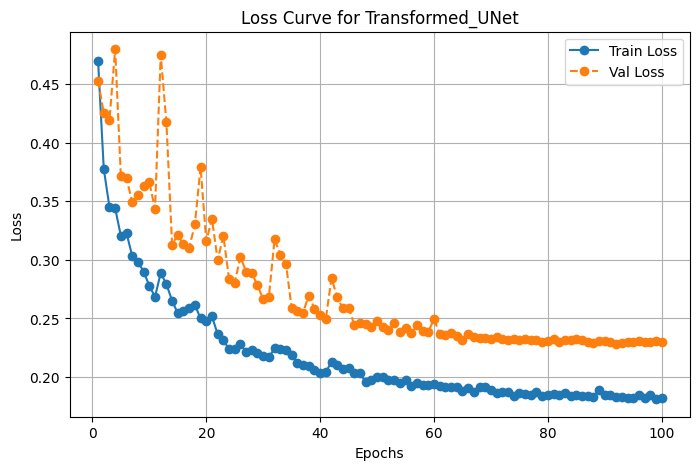

Checkpoint Loaded: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 92, Best Metric: 0.2283


Testing:  90%|█████████ | 9/10 [00:01<00:00,  7.04it/s, Loss=0.265]


Test Loss: 0.2213, Dice Score: 0.5932


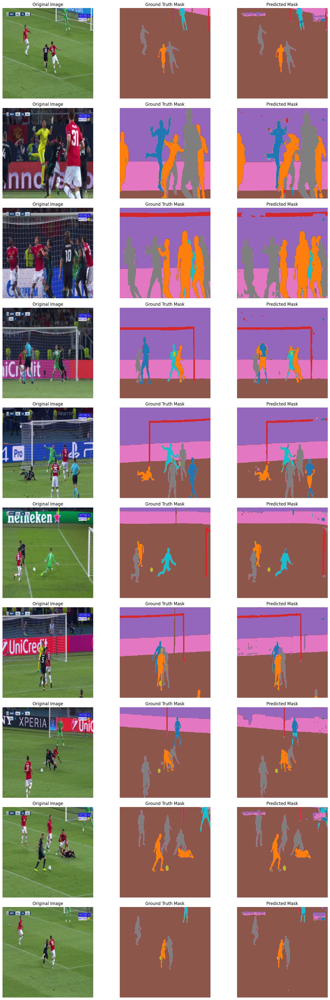

In [29]:
model = UNet(num_classes=11).to(device)
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(model.parameters(), lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)
train_model(model, "Transformed_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(model, "Transformed_UNet", test_transformed_loader, criterion)

when learning with agumented data, we used the ReduceLROnPlateau scheduler.

## 4.3. Attention U-Net

In [30]:
import torch.nn.functional as Func

class AttentionGate(nn.Module):
    def __init__(self, in_channels, gating_channels):
        super(AttentionGate, self).__init__()

        inter_channels = in_channels // 2

        self.W_x = nn.Sequential(
            nn.Conv2d(in_channels, inter_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(inter_channels)
        )

        self.W_g = nn.Sequential(
            nn.Conv2d(gating_channels, inter_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(inter_channels)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(inter_channels, 1, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

    def forward(self, x, g):
        # size correction  (size correction is essential because the encoding step is applies decoding.)
        g = Func.interpolate(g, size=(x.shape[2:]), mode='bilinear', align_corners=True)

        x1 = self.W_x(x)
        g1 = self.W_g(g)

        psi = Func.relu(x1 + g1)
        psi = self.psi(psi)

        return x * psi

class AttentionUNet(nn.Module):
    def __init__(self, num_classes=11):
        super(AttentionUNet, self).__init__()

        def bottleneck_conv_block(in_channels, out_channels):
            return nn.Sequential(
                # first 
                nn.Conv2d(in_channels, out_channels // 4, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels // 4, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),

                # dropout 
                nn.Dropout(0.2),

                #second 
                nn.Conv2d(out_channels, out_channels // 4, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels // 4, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
            )

        # encoding 
        self.encoder1 = bottleneck_conv_block(3, 64)
        self.encoder2 = bottleneck_conv_block(64, 128)
        self.encoder3 = bottleneck_conv_block(128, 256)
        self.encoder4 = bottleneck_conv_block(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = bottleneck_conv_block(512, 1024)

        # decoding 
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.attn4 = AttentionGate(512, 1024)
        self.decoder4 = bottleneck_conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.attn3 = AttentionGate(256, 512)
        self.decoder3 = bottleneck_conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.attn2 = AttentionGate(128, 256)
        self.decoder2 = bottleneck_conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.attn1 = AttentionGate(64, 128)
        self.decoder1 = bottleneck_conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)


    def forward(self, x):
        # encoding 
        e1 = self.encoder1(x)               # (batch, 64, H, W)
        e2 = self.encoder2(self.pool(e1))   # (batch, 128, H/2, W/2)
        e3 = self.encoder3(self.pool(e2))   # (batch, 256, H/4, W/4)
        e4 = self.encoder4(self.pool(e3))   # (batch, 512, H/8, W/8)

        # bottleneck
        b = self.bottleneck(self.pool(e4))  # (batch, 1024, H/16, W/16)

        # decoding 
        d4 = self.upconv4(b)                # (batch, 512, H/8, W/8)
        e4 = self.attn4(e4, b)              # (batch, 512, H/8, W/8)
        d4 = torch.cat((d4, e4), dim=1)     # (batch, 1024, H/8, W/8)
        d4 = self.decoder4(d4)              # (batch, 512, H/8, W/8)

        d3 = self.upconv3(d4)               # (batch, 256, H/4, W/4)
        e3 = self.attn3(e3, d4)             # (batch, 256, H/4, W/4)
        d3 = torch.cat((d3, e3), dim=1)     # (batch, 512, H/4, W/4)
        d3 = self.decoder3(d3)              # (batch, 256, H/4, W/4)

        d2 = self.upconv2(d3)               # (batch, 128, H/2, W/2)
        e2 = self.attn2(e2, d3)             # (batch, 128, H/2, W/2)
        d2 = torch.cat((d2, e2), dim=1)     # (batch, 256, H/2, W/2)
        d2 = self.decoder2(d2)              # (batch, 128, H/2, W/2)

        d1 = self.upconv1(d2)               # (batch, 64, H, W)
        e1 = self.attn1(e1, d2)             # (batch, 64, H, W)
        d1 = torch.cat((d1, e1), dim=1)     # (batch, 128, H/2, W/2)
        d1 = self.decoder1(d1)              # (batch, 64, H, W)

        return self.final_conv(d1)          # (batch, num_classes, H, W)

In [31]:
summary(AttentionUNet(num_classes=11), input_size=(8, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
AttentionUNet                            [8, 11, 256, 256]         --
├─Sequential: 1-1                        [8, 64, 256, 256]         --
│    └─Conv2d: 2-1                       [8, 16, 256, 256]         64
│    └─BatchNorm2d: 2-2                  [8, 16, 256, 256]         32
│    └─ReLU: 2-3                         [8, 16, 256, 256]         --
│    └─Conv2d: 2-4                       [8, 16, 256, 256]         2,320
│    └─BatchNorm2d: 2-5                  [8, 16, 256, 256]         32
│    └─ReLU: 2-6                         [8, 16, 256, 256]         --
│    └─Conv2d: 2-7                       [8, 64, 256, 256]         1,088
│    └─BatchNorm2d: 2-8                  [8, 64, 256, 256]         128
│    └─ReLU: 2-9                         [8, 64, 256, 256]         --
│    └─Dropout: 2-10                     [8, 64, 256, 256]         --
│    └─Conv2d: 2-11                      [8, 16, 256, 256]         1,040
│    

No Checkpoint Found: /kaggle/working/model_storage/AttentionUNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.429]


Epoch [1/100], Loss: 0.5523,  Dice score: 0.1981


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.564]


Validation Loss: 0.5492, Dice score: 0.1335

Learning Rate Updated: 0.005000 -> 0.004999
Best Validation Metric Updated: inf -> 0.5492
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 1, Best Metric: 0.5492


Training 2/100: 100%|██████████| 16/16 [00:23<00:00,  1.49s/it, Loss=0.42]


Epoch [2/100], Loss: 0.4444,  Dice score: 0.2525


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.485]


Validation Loss: 0.4777, Dice score: 0.2026

Learning Rate Updated: 0.004999 -> 0.004995
Best Validation Metric Updated: 0.5492 -> 0.4777
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 2, Best Metric: 0.4777


Training 3/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.455]


Epoch [3/100], Loss: 0.4198,  Dice score: 0.2770


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.43]


Validation Loss: 0.4216, Dice score: 0.2597

Learning Rate Updated: 0.004995 -> 0.004989
Best Validation Metric Updated: 0.4777 -> 0.4216
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 3, Best Metric: 0.4216


Training 4/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.388]


Epoch [4/100], Loss: 0.4212,  Dice score: 0.2827


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.481]


Validation Loss: 0.4448, Dice score: 0.3104

Learning Rate Updated: 0.004989 -> 0.004980


Training 5/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.395]


Epoch [5/100], Loss: 0.4041,  Dice score: 0.3164


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.415]


Validation Loss: 0.4059, Dice score: 0.3118

Learning Rate Updated: 0.004980 -> 0.004969
Best Validation Metric Updated: 0.4216 -> 0.4059
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 5, Best Metric: 0.4059


Training 6/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.359]


Epoch [6/100], Loss: 0.3789,  Dice score: 0.3881


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.398]


Validation Loss: 0.3914, Dice score: 0.3523

Learning Rate Updated: 0.004969 -> 0.004956
Best Validation Metric Updated: 0.4059 -> 0.3914
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 6, Best Metric: 0.3914


Training 7/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.33]


Epoch [7/100], Loss: 0.3562,  Dice score: 0.4318


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.394]


Validation Loss: 0.3895, Dice score: 0.3405

Learning Rate Updated: 0.004956 -> 0.004940
Best Validation Metric Updated: 0.3914 -> 0.3895
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 7, Best Metric: 0.3895


Training 8/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.395]


Epoch [8/100], Loss: 0.3563,  Dice score: 0.4421


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.389]


Validation Loss: 0.3860, Dice score: 0.3340

Learning Rate Updated: 0.004940 -> 0.004921
Best Validation Metric Updated: 0.3895 -> 0.3860
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 8, Best Metric: 0.3860


Training 9/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.34]


Epoch [9/100], Loss: 0.3520,  Dice score: 0.4537


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.418]


Validation Loss: 0.4195, Dice score: 0.3296

Learning Rate Updated: 0.004921 -> 0.004901


Training 10/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.32]


Epoch [10/100], Loss: 0.3227,  Dice score: 0.5036


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.401]


Validation Loss: 0.3976, Dice score: 0.3353

Learning Rate Updated: 0.004901 -> 0.004878


Training 11/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.314]


Epoch [11/100], Loss: 0.3181,  Dice score: 0.5238


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.375]


Validation Loss: 0.3737, Dice score: 0.3476

Learning Rate Updated: 0.004878 -> 0.004852
Best Validation Metric Updated: 0.3860 -> 0.3737
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 11, Best Metric: 0.3737


Training 12/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.36]


Epoch [12/100], Loss: 0.3146,  Dice score: 0.5273


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.378]


Validation Loss: 0.3753, Dice score: 0.3566

Learning Rate Updated: 0.004852 -> 0.004824


Training 13/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.286]


Epoch [13/100], Loss: 0.3125,  Dice score: 0.5314


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.375]


Validation Loss: 0.3705, Dice score: 0.3617

Learning Rate Updated: 0.004824 -> 0.004794
Best Validation Metric Updated: 0.3737 -> 0.3705
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 13, Best Metric: 0.3705


Training 14/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.315]


Epoch [14/100], Loss: 0.3226,  Dice score: 0.5114


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.372]


Validation Loss: 0.3715, Dice score: 0.3727

Learning Rate Updated: 0.004794 -> 0.004762


Training 15/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.289]


Epoch [15/100], Loss: 0.3069,  Dice score: 0.5458


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  2.81it/s, Loss=0.382]


Validation Loss: 0.3738, Dice score: 0.3713

Learning Rate Updated: 0.004762 -> 0.004728


Training 16/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.302]


Epoch [16/100], Loss: 0.3041,  Dice score: 0.5536


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.4]


Validation Loss: 0.3890, Dice score: 0.3571

Learning Rate Updated: 0.004728 -> 0.004691


Training 17/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.277]


Epoch [17/100], Loss: 0.2923,  Dice score: 0.5821


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.354]


Validation Loss: 0.3523, Dice score: 0.4147

Learning Rate Updated: 0.004691 -> 0.004652
Best Validation Metric Updated: 0.3705 -> 0.3523
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 17, Best Metric: 0.3523


Training 18/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.333]


Epoch [18/100], Loss: 0.2878,  Dice score: 0.5900


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.385]


Validation Loss: 0.3827, Dice score: 0.3360

Learning Rate Updated: 0.004652 -> 0.004611


Training 19/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.279]


Epoch [19/100], Loss: 0.2957,  Dice score: 0.5755


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.354]


Validation Loss: 0.3473, Dice score: 0.4307

Learning Rate Updated: 0.004611 -> 0.004568
Best Validation Metric Updated: 0.3523 -> 0.3473
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 19, Best Metric: 0.3473


Training 20/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.294]


Epoch [20/100], Loss: 0.2913,  Dice score: 0.5936


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.365]


Validation Loss: 0.3501, Dice score: 0.4511

Learning Rate Updated: 0.004568 -> 0.004523


Training 21/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.273]


Epoch [21/100], Loss: 0.2807,  Dice score: 0.6078


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s, Loss=0.329]


Validation Loss: 0.3265, Dice score: 0.4740

Learning Rate Updated: 0.004523 -> 0.004475
Best Validation Metric Updated: 0.3473 -> 0.3265
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 21, Best Metric: 0.3265


Training 22/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.284]


Epoch [22/100], Loss: 0.2838,  Dice score: 0.6111


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.332]


Validation Loss: 0.3331, Dice score: 0.4563

Learning Rate Updated: 0.004475 -> 0.004426


Training 23/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.342]


Epoch [23/100], Loss: 0.2958,  Dice score: 0.5895


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.378]


Validation Loss: 0.3652, Dice score: 0.3817

Learning Rate Updated: 0.004426 -> 0.004375


Training 24/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.352]


Epoch [24/100], Loss: 0.2964,  Dice score: 0.6002


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.406]


Validation Loss: 0.3884, Dice score: 0.3757

Learning Rate Updated: 0.004375 -> 0.004323


Training 25/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.277]


Epoch [25/100], Loss: 0.2822,  Dice score: 0.6001


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.403]


Validation Loss: 0.3816, Dice score: 0.3879

Learning Rate Updated: 0.004323 -> 0.004268


Training 26/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.233]


Epoch [26/100], Loss: 0.2737,  Dice score: 0.6241


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  2.81it/s, Loss=0.36]


Validation Loss: 0.3500, Dice score: 0.4275

Learning Rate Updated: 0.004268 -> 0.004212


Training 27/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.288]


Epoch [27/100], Loss: 0.2718,  Dice score: 0.6255


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.337]


Validation Loss: 0.3278, Dice score: 0.4744

Learning Rate Updated: 0.004212 -> 0.004153


Training 28/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.227]


Epoch [28/100], Loss: 0.2601,  Dice score: 0.6553


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.314]


Validation Loss: 0.3102, Dice score: 0.5086

Learning Rate Updated: 0.004153 -> 0.004094
Best Validation Metric Updated: 0.3265 -> 0.3102
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 28, Best Metric: 0.3102


Training 29/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.236]


Epoch [29/100], Loss: 0.2617,  Dice score: 0.6379


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.366]


Validation Loss: 0.3476, Dice score: 0.4307

Learning Rate Updated: 0.004094 -> 0.004032


Training 30/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.233]


Epoch [30/100], Loss: 0.2633,  Dice score: 0.6423


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, Loss=0.348]


Validation Loss: 0.3398, Dice score: 0.4481

Learning Rate Updated: 0.004032 -> 0.003970


Training 31/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.239]


Epoch [31/100], Loss: 0.2593,  Dice score: 0.6421


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.326]


Validation Loss: 0.3164, Dice score: 0.5239

Learning Rate Updated: 0.003970 -> 0.003905


Training 32/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.229]


Epoch [32/100], Loss: 0.2566,  Dice score: 0.6550


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.314]


Validation Loss: 0.3148, Dice score: 0.5025

Learning Rate Updated: 0.003905 -> 0.003840


Training 33/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.245]


Epoch [33/100], Loss: 0.2601,  Dice score: 0.6520


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.297]


Validation Loss: 0.2926, Dice score: 0.5437

Learning Rate Updated: 0.003840 -> 0.003773
Best Validation Metric Updated: 0.3102 -> 0.2926
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 33, Best Metric: 0.2926


Training 34/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.27]


Epoch [34/100], Loss: 0.2571,  Dice score: 0.6427


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.324]


Validation Loss: 0.3113, Dice score: 0.5380

Learning Rate Updated: 0.003773 -> 0.003705


Training 35/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.247]


Epoch [35/100], Loss: 0.2507,  Dice score: 0.6641


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.296]


Validation Loss: 0.2923, Dice score: 0.5437

Learning Rate Updated: 0.003705 -> 0.003635
Best Validation Metric Updated: 0.2926 -> 0.2923
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 35, Best Metric: 0.2923


Training 36/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.287]


Epoch [36/100], Loss: 0.2513,  Dice score: 0.6689


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.381]


Validation Loss: 0.3622, Dice score: 0.4483

Learning Rate Updated: 0.003635 -> 0.003565


Training 37/100: 100%|██████████| 16/16 [00:23<00:00,  1.47s/it, Loss=0.244]


Epoch [37/100], Loss: 0.2532,  Dice score: 0.6523


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.331]


Validation Loss: 0.3274, Dice score: 0.4888

Learning Rate Updated: 0.003565 -> 0.003493


Training 38/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.232]


Epoch [38/100], Loss: 0.2475,  Dice score: 0.6851


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.293]


Validation Loss: 0.2912, Dice score: 0.5710

Learning Rate Updated: 0.003493 -> 0.003421
Best Validation Metric Updated: 0.2923 -> 0.2912
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 38, Best Metric: 0.2912


Training 39/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.233]


Epoch [39/100], Loss: 0.2451,  Dice score: 0.6767


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.299]


Validation Loss: 0.3052, Dice score: 0.5491

Learning Rate Updated: 0.003421 -> 0.003347


Training 40/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.224]


Epoch [40/100], Loss: 0.2482,  Dice score: 0.6750


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.345]


Validation Loss: 0.3365, Dice score: 0.4743

Learning Rate Updated: 0.003347 -> 0.003273


Training 41/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.257]


Epoch [41/100], Loss: 0.2536,  Dice score: 0.6635


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.307]


Validation Loss: 0.3032, Dice score: 0.5290

Learning Rate Updated: 0.003273 -> 0.003198


Training 42/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.278]


Epoch [42/100], Loss: 0.2490,  Dice score: 0.6611


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.317]


Validation Loss: 0.3059, Dice score: 0.5393

Learning Rate Updated: 0.003198 -> 0.003122


Training 43/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.246]


Epoch [43/100], Loss: 0.2324,  Dice score: 0.6954


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.336]


Validation Loss: 0.3301, Dice score: 0.4822

Learning Rate Updated: 0.003122 -> 0.003046


Training 44/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.242]


Epoch [44/100], Loss: 0.2384,  Dice score: 0.6840


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.283]


Validation Loss: 0.2822, Dice score: 0.5846

Learning Rate Updated: 0.003046 -> 0.002969
Best Validation Metric Updated: 0.2912 -> 0.2822
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 44, Best Metric: 0.2822


Training 45/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.214]


Epoch [45/100], Loss: 0.2343,  Dice score: 0.6860


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.285]


Validation Loss: 0.2900, Dice score: 0.6144

Learning Rate Updated: 0.002969 -> 0.002892


Training 46/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.247]


Epoch [46/100], Loss: 0.2312,  Dice score: 0.7014


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.286]


Validation Loss: 0.2846, Dice score: 0.5805

Learning Rate Updated: 0.002892 -> 0.002814


Training 47/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.211]


Epoch [47/100], Loss: 0.2298,  Dice score: 0.7098


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  2.81it/s, Loss=0.316]


Validation Loss: 0.3145, Dice score: 0.4956

Learning Rate Updated: 0.002814 -> 0.002736


Training 48/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.222]


Epoch [48/100], Loss: 0.2281,  Dice score: 0.7253


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s, Loss=0.284]


Validation Loss: 0.2815, Dice score: 0.6144

Learning Rate Updated: 0.002736 -> 0.002657
Best Validation Metric Updated: 0.2822 -> 0.2815
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 48, Best Metric: 0.2815


Training 49/100: 100%|██████████| 16/16 [00:23<00:00,  1.47s/it, Loss=0.217]


Epoch [49/100], Loss: 0.2266,  Dice score: 0.7119


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.289]


Validation Loss: 0.2869, Dice score: 0.5551

Learning Rate Updated: 0.002657 -> 0.002579


Training 50/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.24]


Epoch [50/100], Loss: 0.2272,  Dice score: 0.7144


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.309]


Validation Loss: 0.3060, Dice score: 0.5213

Learning Rate Updated: 0.002579 -> 0.002501


Training 51/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.234]


Epoch [51/100], Loss: 0.2301,  Dice score: 0.7056


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.278]


Validation Loss: 0.2772, Dice score: 0.5854

Learning Rate Updated: 0.002501 -> 0.002422
Best Validation Metric Updated: 0.2815 -> 0.2772
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 51, Best Metric: 0.2772


Training 52/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.218]


Epoch [52/100], Loss: 0.2306,  Dice score: 0.7032


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.268]


Validation Loss: 0.2725, Dice score: 0.5849

Learning Rate Updated: 0.002422 -> 0.002344
Best Validation Metric Updated: 0.2772 -> 0.2725
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 52, Best Metric: 0.2725


Training 53/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.249]


Epoch [53/100], Loss: 0.2261,  Dice score: 0.7153


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.283]


Validation Loss: 0.2808, Dice score: 0.5789

Learning Rate Updated: 0.002344 -> 0.002265


Training 54/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.206]


Epoch [54/100], Loss: 0.2234,  Dice score: 0.7209


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.273]


Validation Loss: 0.2753, Dice score: 0.5681

Learning Rate Updated: 0.002265 -> 0.002187


Training 55/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.229]


Epoch [55/100], Loss: 0.2248,  Dice score: 0.7187


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.272]


Validation Loss: 0.2754, Dice score: 0.5660

Learning Rate Updated: 0.002187 -> 0.002109


Training 56/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.2]


Epoch [56/100], Loss: 0.2302,  Dice score: 0.7086


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.27]


Validation Loss: 0.2735, Dice score: 0.5698

Learning Rate Updated: 0.002109 -> 0.002032


Training 57/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.211]


Epoch [57/100], Loss: 0.2234,  Dice score: 0.7124


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.261]


Validation Loss: 0.2678, Dice score: 0.5962

Learning Rate Updated: 0.002032 -> 0.001955
Best Validation Metric Updated: 0.2725 -> 0.2678
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 57, Best Metric: 0.2678


Training 58/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.226]


Epoch [58/100], Loss: 0.2236,  Dice score: 0.7127


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  2.81it/s, Loss=0.266]


Validation Loss: 0.2684, Dice score: 0.5856

Learning Rate Updated: 0.001955 -> 0.001879


Training 59/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.253]


Epoch [59/100], Loss: 0.2199,  Dice score: 0.7278


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.273]


Validation Loss: 0.2729, Dice score: 0.5709

Learning Rate Updated: 0.001879 -> 0.001803


Training 60/100: 100%|██████████| 16/16 [00:23<00:00,  1.47s/it, Loss=0.215]


Epoch [60/100], Loss: 0.2181,  Dice score: 0.7236


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.291]


Validation Loss: 0.2861, Dice score: 0.5788

Learning Rate Updated: 0.001803 -> 0.001728


Training 61/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.207]


Epoch [61/100], Loss: 0.2201,  Dice score: 0.7090


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.282]


Validation Loss: 0.2839, Dice score: 0.5461

Learning Rate Updated: 0.001728 -> 0.001654


Training 62/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.244]


Epoch [62/100], Loss: 0.2177,  Dice score: 0.6990


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.263]


Validation Loss: 0.2656, Dice score: 0.6508

Learning Rate Updated: 0.001654 -> 0.001580
Best Validation Metric Updated: 0.2678 -> 0.2656
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 62, Best Metric: 0.2656


Training 63/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.253]


Epoch [63/100], Loss: 0.2156,  Dice score: 0.7106


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.286]


Validation Loss: 0.2817, Dice score: 0.6059

Learning Rate Updated: 0.001580 -> 0.001508


Training 64/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.252]


Epoch [64/100], Loss: 0.2180,  Dice score: 0.7017


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.259]


Validation Loss: 0.2633, Dice score: 0.6086

Learning Rate Updated: 0.001508 -> 0.001436
Best Validation Metric Updated: 0.2656 -> 0.2633
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 64, Best Metric: 0.2633


Training 65/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.223]


Epoch [65/100], Loss: 0.2174,  Dice score: 0.6990


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.265]


Validation Loss: 0.2678, Dice score: 0.6036

Learning Rate Updated: 0.001436 -> 0.001366


Training 66/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.244]


Epoch [66/100], Loss: 0.2188,  Dice score: 0.7065


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.268]


Validation Loss: 0.2696, Dice score: 0.5827

Learning Rate Updated: 0.001366 -> 0.001296


Training 67/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.235]


Epoch [67/100], Loss: 0.2168,  Dice score: 0.7064


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.258]


Validation Loss: 0.2634, Dice score: 0.6064

Learning Rate Updated: 0.001296 -> 0.001228


Training 68/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.203]


Epoch [68/100], Loss: 0.2150,  Dice score: 0.6954


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.257]


Validation Loss: 0.2665, Dice score: 0.6131

Learning Rate Updated: 0.001228 -> 0.001161


Training 69/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.234]


Epoch [69/100], Loss: 0.2133,  Dice score: 0.7131


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.256]


Validation Loss: 0.2627, Dice score: 0.6097

Learning Rate Updated: 0.001161 -> 0.001096
Best Validation Metric Updated: 0.2633 -> 0.2627
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 69, Best Metric: 0.2627


Training 70/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.194]


Epoch [70/100], Loss: 0.2127,  Dice score: 0.7038


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  2.47it/s, Loss=0.265]


Validation Loss: 0.2678, Dice score: 0.6186

Learning Rate Updated: 0.001096 -> 0.001031


Training 71/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.219]


Epoch [71/100], Loss: 0.2135,  Dice score: 0.7129


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.268]


Validation Loss: 0.2671, Dice score: 0.6051

Learning Rate Updated: 0.001031 -> 0.000969


Training 72/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.202]


Epoch [72/100], Loss: 0.2155,  Dice score: 0.7131


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.254]


Validation Loss: 0.2596, Dice score: 0.6693

Learning Rate Updated: 0.000969 -> 0.000907
Best Validation Metric Updated: 0.2627 -> 0.2596
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 72, Best Metric: 0.2596


Training 73/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.219]


Epoch [73/100], Loss: 0.2082,  Dice score: 0.7390


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=0.253]


Validation Loss: 0.2592, Dice score: 0.6381

Learning Rate Updated: 0.000907 -> 0.000848
Best Validation Metric Updated: 0.2596 -> 0.2592
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 73, Best Metric: 0.2592


Training 74/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.217]


Epoch [74/100], Loss: 0.2125,  Dice score: 0.7234


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  2.54it/s, Loss=0.257]


Validation Loss: 0.2626, Dice score: 0.6280

Learning Rate Updated: 0.000848 -> 0.000789


Training 75/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.189]


Epoch [75/100], Loss: 0.2122,  Dice score: 0.7171


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  2.42it/s, Loss=0.259]


Validation Loss: 0.2643, Dice score: 0.6472

Learning Rate Updated: 0.000789 -> 0.000733


Training 76/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.235]


Epoch [76/100], Loss: 0.2102,  Dice score: 0.7298


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.248]


Validation Loss: 0.2562, Dice score: 0.6595

Learning Rate Updated: 0.000733 -> 0.000678
Best Validation Metric Updated: 0.2592 -> 0.2562
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 76, Best Metric: 0.2562


Training 77/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.215]


Epoch [77/100], Loss: 0.2083,  Dice score: 0.7263


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.248]


Validation Loss: 0.2558, Dice score: 0.6490

Learning Rate Updated: 0.000678 -> 0.000626
Best Validation Metric Updated: 0.2562 -> 0.2558
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 77, Best Metric: 0.2558


Training 78/100: 100%|██████████| 16/16 [00:22<00:00,  1.44s/it, Loss=0.211]


Epoch [78/100], Loss: 0.2098,  Dice score: 0.7334


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s, Loss=0.249]


Validation Loss: 0.2568, Dice score: 0.6541

Learning Rate Updated: 0.000626 -> 0.000575


Training 79/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.183]


Epoch [79/100], Loss: 0.2108,  Dice score: 0.7271


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  2.51it/s, Loss=0.244]


Validation Loss: 0.2553, Dice score: 0.6538

Learning Rate Updated: 0.000575 -> 0.000526
Best Validation Metric Updated: 0.2558 -> 0.2553
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 79, Best Metric: 0.2553


Training 80/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.209]


Epoch [80/100], Loss: 0.2073,  Dice score: 0.7366


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.245]


Validation Loss: 0.2548, Dice score: 0.6649

Learning Rate Updated: 0.000526 -> 0.000478
Best Validation Metric Updated: 0.2553 -> 0.2548
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 80, Best Metric: 0.2548


Training 81/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.226]


Epoch [81/100], Loss: 0.2138,  Dice score: 0.7041


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.253]


Validation Loss: 0.2576, Dice score: 0.6459

Learning Rate Updated: 0.000478 -> 0.000433


Training 82/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.209]


Epoch [82/100], Loss: 0.2066,  Dice score: 0.7235


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.244]


Validation Loss: 0.2531, Dice score: 0.6620

Learning Rate Updated: 0.000433 -> 0.000390
Best Validation Metric Updated: 0.2548 -> 0.2531
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 82, Best Metric: 0.2531


Training 83/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.184]


Epoch [83/100], Loss: 0.2042,  Dice score: 0.7491


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  2.53it/s, Loss=0.246]


Validation Loss: 0.2544, Dice score: 0.6710

Learning Rate Updated: 0.000390 -> 0.000349


Training 84/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.198]


Epoch [84/100], Loss: 0.2043,  Dice score: 0.7399


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.246]


Validation Loss: 0.2532, Dice score: 0.6556

Learning Rate Updated: 0.000349 -> 0.000310


Training 85/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.208]


Epoch [85/100], Loss: 0.2052,  Dice score: 0.7369


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.243]


Validation Loss: 0.2512, Dice score: 0.6741

Learning Rate Updated: 0.000310 -> 0.000273
Best Validation Metric Updated: 0.2531 -> 0.2512
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 85, Best Metric: 0.2512


Training 86/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.205]


Epoch [86/100], Loss: 0.2040,  Dice score: 0.7532


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.24]


Validation Loss: 0.2503, Dice score: 0.6661

Learning Rate Updated: 0.000273 -> 0.000239
Best Validation Metric Updated: 0.2512 -> 0.2503
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 86, Best Metric: 0.2503


Training 87/100: 100%|██████████| 16/16 [00:23<00:00,  1.47s/it, Loss=0.233]


Epoch [87/100], Loss: 0.2054,  Dice score: 0.7353


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.242]


Validation Loss: 0.2518, Dice score: 0.6672

Learning Rate Updated: 0.000239 -> 0.000207


Training 88/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.219]


Epoch [88/100], Loss: 0.2048,  Dice score: 0.7400


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  2.81it/s, Loss=0.242]


Validation Loss: 0.2523, Dice score: 0.6752

Learning Rate Updated: 0.000207 -> 0.000177


Training 89/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.195]


Epoch [89/100], Loss: 0.2060,  Dice score: 0.7317


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.24]


Validation Loss: 0.2508, Dice score: 0.6748

Learning Rate Updated: 0.000177 -> 0.000149


Training 90/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.217]


Epoch [90/100], Loss: 0.2045,  Dice score: 0.7468


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.24]


Validation Loss: 0.2504, Dice score: 0.6736

Learning Rate Updated: 0.000149 -> 0.000123


Training 91/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.23]


Epoch [91/100], Loss: 0.2055,  Dice score: 0.7388


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.239]


Validation Loss: 0.2501, Dice score: 0.6724

Learning Rate Updated: 0.000123 -> 0.000100
Best Validation Metric Updated: 0.2503 -> 0.2501
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 91, Best Metric: 0.2501


Training 92/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.219]


Epoch [92/100], Loss: 0.2032,  Dice score: 0.7455


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.241]


Validation Loss: 0.2510, Dice score: 0.6681

Learning Rate Updated: 0.000100 -> 0.000080


Training 93/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.218]


Epoch [93/100], Loss: 0.2039,  Dice score: 0.7459


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.241]


Validation Loss: 0.2512, Dice score: 0.6733

Learning Rate Updated: 0.000080 -> 0.000061


Training 94/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.193]


Epoch [94/100], Loss: 0.2041,  Dice score: 0.7483


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.24]


Validation Loss: 0.2502, Dice score: 0.6704

Learning Rate Updated: 0.000061 -> 0.000045


Training 95/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.233]


Epoch [95/100], Loss: 0.2059,  Dice score: 0.7308


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.24]


Validation Loss: 0.2503, Dice score: 0.6721

Learning Rate Updated: 0.000045 -> 0.000032


Training 96/100: 100%|██████████| 16/16 [00:22<00:00,  1.43s/it, Loss=0.194]


Epoch [96/100], Loss: 0.2063,  Dice score: 0.7379


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.239]


Validation Loss: 0.2500, Dice score: 0.6756

Learning Rate Updated: 0.000032 -> 0.000021
Best Validation Metric Updated: 0.2501 -> 0.2500
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 96, Best Metric: 0.2500


Training 97/100: 100%|██████████| 16/16 [00:23<00:00,  1.47s/it, Loss=0.228]


Epoch [97/100], Loss: 0.2048,  Dice score: 0.7537


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.239]


Validation Loss: 0.2501, Dice score: 0.6759

Learning Rate Updated: 0.000021 -> 0.000012


Training 98/100: 100%|██████████| 16/16 [00:23<00:00,  1.45s/it, Loss=0.189]


Epoch [98/100], Loss: 0.2067,  Dice score: 0.7331


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.24]


Validation Loss: 0.2506, Dice score: 0.6751

Learning Rate Updated: 0.000012 -> 0.000006


Training 99/100: 100%|██████████| 16/16 [00:23<00:00,  1.46s/it, Loss=0.186]


Epoch [99/100], Loss: 0.2041,  Dice score: 0.7451


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.24]


Validation Loss: 0.2510, Dice score: 0.6753

Learning Rate Updated: 0.000006 -> 0.000002


Training 100/100: 100%|██████████| 16/16 [00:23<00:00,  1.44s/it, Loss=0.25]


Epoch [100/100], Loss: 0.2053,  Dice score: 0.7349


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.239]


Validation Loss: 0.2505, Dice score: 0.6770

Learning Rate Updated: 0.000002 -> 0.000001


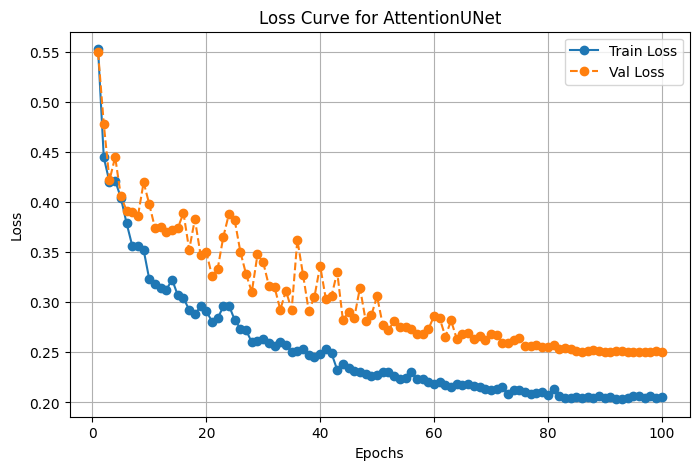

Checkpoint Loaded: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 96, Best Metric: 0.2500


Testing:  90%|█████████ | 9/10 [00:01<00:00,  5.53it/s, Loss=0.308]


Test Loss: 0.2447, Dice Score: 0.5598


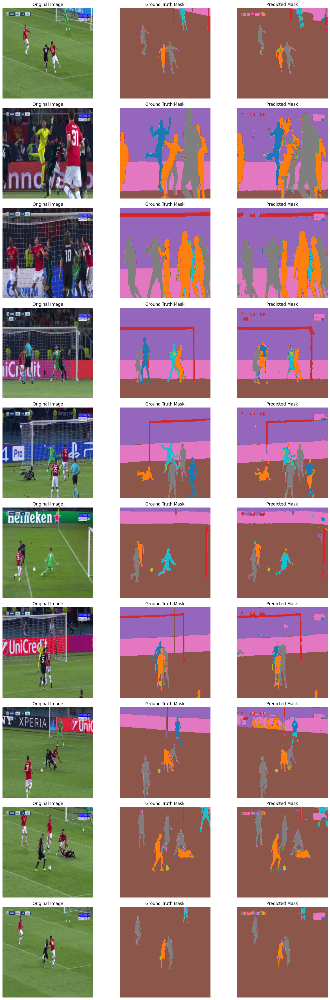

In [32]:
attention_model = AttentionUNet(num_classes=11).to(device)
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(attention_model.parameters(), lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
train_model(attention_model, "AttentionUNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(attention_model, "AttentionUNet", test_transformed_loader, criterion)

## 4.4. Backbone(ResNet50)

In [33]:
# create U-Net  model (backnonme : ResNet-50, 11 classes )
backbone_model = smp.Unet(
    encoder_name="resnet50",      # ResNet-50
    encoder_weights="imagenet",
    in_channels=3,                #input channel  (RGB)
    classes=11                    #output classes (11)
)

print(backbone_model)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 290MB/s]


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

No Checkpoint Found: /kaggle/working/model_storage/Backbone_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.445]


Epoch [1/100], Loss: 0.4973,  Dice score: 0.2353


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=886]


Validation Loss: 934.9333, Dice score: 0.0832

Best Validation Metric Updated: inf -> 934.9333
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 1, Best Metric: 934.9333


Training 2/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.381]


Epoch [2/100], Loss: 0.4088,  Dice score: 0.2936


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=1.15]


Validation Loss: 1.3809, Dice score: 0.2366

Best Validation Metric Updated: 934.9333 -> 1.3809
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 2, Best Metric: 1.3809


Training 3/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.371]


Epoch [3/100], Loss: 0.3853,  Dice score: 0.4207


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.416]


Validation Loss: 0.4063, Dice score: 0.3159

Best Validation Metric Updated: 1.3809 -> 0.4063
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 3, Best Metric: 0.4063


Training 4/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.299]


Epoch [4/100], Loss: 0.3436,  Dice score: 0.4820


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.384]


Validation Loss: 0.3767, Dice score: 0.3545

Best Validation Metric Updated: 0.4063 -> 0.3767
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 4, Best Metric: 0.3767


Training 5/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.316]


Epoch [5/100], Loss: 0.3247,  Dice score: 0.5023


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  2.51it/s, Loss=0.376]


Validation Loss: 0.3657, Dice score: 0.3894

Best Validation Metric Updated: 0.3767 -> 0.3657
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 5, Best Metric: 0.3657


Training 6/100: 100%|██████████| 16/16 [00:18<00:00,  1.14s/it, Loss=0.303]


Epoch [6/100], Loss: 0.3202,  Dice score: 0.5188


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.383]


Validation Loss: 0.3768, Dice score: 0.3680



Training 7/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.305]


Epoch [7/100], Loss: 0.3091,  Dice score: 0.5446


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.372]


Validation Loss: 0.3733, Dice score: 0.3909



Training 8/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.276]


Epoch [8/100], Loss: 0.2952,  Dice score: 0.5510


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.375]


Validation Loss: 0.3595, Dice score: 0.3947

Best Validation Metric Updated: 0.3657 -> 0.3595
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 8, Best Metric: 0.3595


Training 9/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.272]


Epoch [9/100], Loss: 0.2810,  Dice score: 0.5999


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.331]


Validation Loss: 0.3301, Dice score: 0.4730

Best Validation Metric Updated: 0.3595 -> 0.3301
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 9, Best Metric: 0.3301


Training 10/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.283]


Epoch [10/100], Loss: 0.2756,  Dice score: 0.6090


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.332]


Validation Loss: 0.3279, Dice score: 0.4878

Best Validation Metric Updated: 0.3301 -> 0.3279
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 10, Best Metric: 0.3279


Training 11/100: 100%|██████████| 16/16 [00:18<00:00,  1.19s/it, Loss=0.266]


Epoch [11/100], Loss: 0.2742,  Dice score: 0.6104


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.357]


Validation Loss: 0.3597, Dice score: 0.4021



Training 12/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.278]


Epoch [12/100], Loss: 0.2789,  Dice score: 0.6236


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.339]


Validation Loss: 0.3340, Dice score: 0.4601



Training 13/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.266]


Epoch [13/100], Loss: 0.2621,  Dice score: 0.6537


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.349]


Validation Loss: 0.3468, Dice score: 0.4479



Training 14/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.247]


Epoch [14/100], Loss: 0.2557,  Dice score: 0.6736


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.332]


Validation Loss: 0.3265, Dice score: 0.4705

Best Validation Metric Updated: 0.3279 -> 0.3265
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 14, Best Metric: 0.3265


Training 15/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.235]


Epoch [15/100], Loss: 0.2458,  Dice score: 0.6767


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.399]


Validation Loss: 0.3936, Dice score: 0.3728



Training 16/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.24]


Epoch [16/100], Loss: 0.2454,  Dice score: 0.6748


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.325]


Validation Loss: 0.3314, Dice score: 0.4634



Training 17/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.218]


Epoch [17/100], Loss: 0.2446,  Dice score: 0.6854


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.398]


Validation Loss: 0.4247, Dice score: 0.4051



Training 18/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.241]


Epoch [18/100], Loss: 0.2415,  Dice score: 0.6729


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.325]


Validation Loss: 0.3182, Dice score: 0.5095

Best Validation Metric Updated: 0.3265 -> 0.3182
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 18, Best Metric: 0.3182


Training 19/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.277]


Epoch [19/100], Loss: 0.2393,  Dice score: 0.6655


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  2.41it/s, Loss=0.302]


Validation Loss: 0.2997, Dice score: 0.5892

Best Validation Metric Updated: 0.3182 -> 0.2997
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 19, Best Metric: 0.2997


Training 20/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.245]


Epoch [20/100], Loss: 0.2373,  Dice score: 0.6576


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.303]


Validation Loss: 0.3016, Dice score: 0.5493



Training 21/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.285]


Epoch [21/100], Loss: 0.2424,  Dice score: 0.6760


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.35]


Validation Loss: 0.3560, Dice score: 0.4938



Training 22/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.19]


Epoch [22/100], Loss: 0.2400,  Dice score: 0.6690


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.312]


Validation Loss: 0.3098, Dice score: 0.5168



Training 23/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.258]


Epoch [23/100], Loss: 0.2328,  Dice score: 0.6839


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.327]


Validation Loss: 0.3251, Dice score: 0.5296

Learning Rate Updated: 0.005000 -> 0.002500


Training 24/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.203]


Epoch [24/100], Loss: 0.2271,  Dice score: 0.7033


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.29]


Validation Loss: 0.2938, Dice score: 0.6174

Best Validation Metric Updated: 0.2997 -> 0.2938
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 24, Best Metric: 0.2938


Training 25/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.204]


Epoch [25/100], Loss: 0.2230,  Dice score: 0.6974


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.329]


Validation Loss: 0.3316, Dice score: 0.5036



Training 26/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.204]


Epoch [26/100], Loss: 0.2214,  Dice score: 0.7160


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.305]


Validation Loss: 0.2996, Dice score: 0.6264



Training 27/100: 100%|██████████| 16/16 [00:18<00:00,  1.19s/it, Loss=0.21]


Epoch [27/100], Loss: 0.2197,  Dice score: 0.7269


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.267]


Validation Loss: 0.2720, Dice score: 0.6168

Best Validation Metric Updated: 0.2938 -> 0.2720
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 27, Best Metric: 0.2720


Training 28/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.22]


Epoch [28/100], Loss: 0.2130,  Dice score: 0.7316


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.268]


Validation Loss: 0.2732, Dice score: 0.6108



Training 29/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.221]


Epoch [29/100], Loss: 0.2103,  Dice score: 0.7365


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s, Loss=0.253]


Validation Loss: 0.2634, Dice score: 0.6612

Best Validation Metric Updated: 0.2720 -> 0.2634
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 29, Best Metric: 0.2634


Training 30/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.232]


Epoch [30/100], Loss: 0.2102,  Dice score: 0.7333


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.272]


Validation Loss: 0.2705, Dice score: 0.6600



Training 31/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.191]


Epoch [31/100], Loss: 0.2094,  Dice score: 0.7391


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.259]


Validation Loss: 0.2618, Dice score: 0.6629

Best Validation Metric Updated: 0.2634 -> 0.2618
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 31, Best Metric: 0.2618


Training 32/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.221]


Epoch [32/100], Loss: 0.2102,  Dice score: 0.7328


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.271]


Validation Loss: 0.2711, Dice score: 0.6595



Training 33/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.181]


Epoch [33/100], Loss: 0.2067,  Dice score: 0.7415


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.25]


Validation Loss: 0.2610, Dice score: 0.6960

Best Validation Metric Updated: 0.2618 -> 0.2610
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 33, Best Metric: 0.2610


Training 34/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.192]


Epoch [34/100], Loss: 0.2054,  Dice score: 0.7437


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.256]


Validation Loss: 0.2652, Dice score: 0.6559



Training 35/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.213]


Epoch [35/100], Loss: 0.2054,  Dice score: 0.7473


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.281]


Validation Loss: 0.2896, Dice score: 0.5697



Training 36/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.241]


Epoch [36/100], Loss: 0.2088,  Dice score: 0.7464


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.282]


Validation Loss: 0.2809, Dice score: 0.6134



Training 37/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.212]


Epoch [37/100], Loss: 0.2073,  Dice score: 0.7485


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s, Loss=0.249]


Validation Loss: 0.2559, Dice score: 0.6522

Best Validation Metric Updated: 0.2610 -> 0.2559
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 37, Best Metric: 0.2559


Training 38/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.164]


Epoch [38/100], Loss: 0.2040,  Dice score: 0.7714


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.242]


Validation Loss: 0.2530, Dice score: 0.6812

Best Validation Metric Updated: 0.2559 -> 0.2530
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 38, Best Metric: 0.2530


Training 39/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.207]


Epoch [39/100], Loss: 0.2031,  Dice score: 0.7537


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.278]


Validation Loss: 0.2823, Dice score: 0.6022



Training 40/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.191]


Epoch [40/100], Loss: 0.2022,  Dice score: 0.7559


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.248]


Validation Loss: 0.2603, Dice score: 0.6435



Training 41/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.2]


Epoch [41/100], Loss: 0.2030,  Dice score: 0.7537


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.24]


Validation Loss: 0.2505, Dice score: 0.6658

Best Validation Metric Updated: 0.2530 -> 0.2505
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 41, Best Metric: 0.2505


Training 42/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.211]


Epoch [42/100], Loss: 0.2040,  Dice score: 0.7492


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.247]


Validation Loss: 0.2652, Dice score: 0.6414



Training 43/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.218]


Epoch [43/100], Loss: 0.2050,  Dice score: 0.7450


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.242]


Validation Loss: 0.2475, Dice score: 0.6652

Best Validation Metric Updated: 0.2505 -> 0.2475
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 43, Best Metric: 0.2475


Training 44/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.226]


Epoch [44/100], Loss: 0.2031,  Dice score: 0.7548


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.262]


Validation Loss: 0.2664, Dice score: 0.6471



Training 45/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.211]


Epoch [45/100], Loss: 0.2014,  Dice score: 0.7566


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  2.44it/s, Loss=0.289]


Validation Loss: 0.2932, Dice score: 0.5777



Training 46/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.198]


Epoch [46/100], Loss: 0.1989,  Dice score: 0.7607


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  2.51it/s, Loss=0.268]


Validation Loss: 0.2754, Dice score: 0.6063



Training 47/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.208]


Epoch [47/100], Loss: 0.2003,  Dice score: 0.7675


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.239]


Validation Loss: 0.2503, Dice score: 0.6797

Learning Rate Updated: 0.002500 -> 0.001250


Training 48/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.224]


Epoch [48/100], Loss: 0.1955,  Dice score: 0.7834


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.236]


Validation Loss: 0.2456, Dice score: 0.6595

Best Validation Metric Updated: 0.2475 -> 0.2456
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 48, Best Metric: 0.2456


Training 49/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.199]


Epoch [49/100], Loss: 0.1944,  Dice score: 0.7899


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.237]


Validation Loss: 0.2475, Dice score: 0.6714



Training 50/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.244]


Epoch [50/100], Loss: 0.1926,  Dice score: 0.7756


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s, Loss=0.224]


Validation Loss: 0.2386, Dice score: 0.7050

Best Validation Metric Updated: 0.2456 -> 0.2386
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 50, Best Metric: 0.2386


Training 51/100: 100%|██████████| 16/16 [00:18<00:00,  1.19s/it, Loss=0.232]


Epoch [51/100], Loss: 0.1905,  Dice score: 0.7787


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.231]


Validation Loss: 0.2416, Dice score: 0.6954



Training 52/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.228]


Epoch [52/100], Loss: 0.1905,  Dice score: 0.7937


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.22]


Validation Loss: 0.2311, Dice score: 0.7120

Best Validation Metric Updated: 0.2386 -> 0.2311
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 52, Best Metric: 0.2311


Training 53/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.211]


Epoch [53/100], Loss: 0.1895,  Dice score: 0.8045


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.223]


Validation Loss: 0.2369, Dice score: 0.7050



Training 54/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.209]


Epoch [54/100], Loss: 0.1903,  Dice score: 0.7857


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.22]


Validation Loss: 0.2340, Dice score: 0.7034



Training 55/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.204]


Epoch [55/100], Loss: 0.1878,  Dice score: 0.8022


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.233]


Validation Loss: 0.2417, Dice score: 0.6910



Training 56/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.205]


Epoch [56/100], Loss: 0.1911,  Dice score: 0.7905


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.226]


Validation Loss: 0.2375, Dice score: 0.6937

Learning Rate Updated: 0.001250 -> 0.000625


Training 57/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.157]


Epoch [57/100], Loss: 0.1888,  Dice score: 0.8066


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.216]


Validation Loss: 0.2294, Dice score: 0.7208

Best Validation Metric Updated: 0.2311 -> 0.2294
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 57, Best Metric: 0.2294


Training 58/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.231]


Epoch [58/100], Loss: 0.1870,  Dice score: 0.7983


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.218]


Validation Loss: 0.2318, Dice score: 0.7237



Training 59/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.17]


Epoch [59/100], Loss: 0.1849,  Dice score: 0.8212


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.216]


Validation Loss: 0.2321, Dice score: 0.7276



Training 60/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.214]


Epoch [60/100], Loss: 0.1821,  Dice score: 0.8136


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.216]


Validation Loss: 0.2298, Dice score: 0.7270



Training 61/100: 100%|██████████| 16/16 [00:17<00:00,  1.12s/it, Loss=0.186]


Epoch [61/100], Loss: 0.1803,  Dice score: 0.8153


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.216]


Validation Loss: 0.2294, Dice score: 0.7182

Best Validation Metric Updated: 0.2294 -> 0.2294
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 61, Best Metric: 0.2294


Training 62/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.186]


Epoch [62/100], Loss: 0.1835,  Dice score: 0.8211


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.218]


Validation Loss: 0.2323, Dice score: 0.7156



Training 63/100: 100%|██████████| 16/16 [00:18<00:00,  1.19s/it, Loss=0.183]


Epoch [63/100], Loss: 0.1844,  Dice score: 0.8166


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.215]


Validation Loss: 0.2290, Dice score: 0.7271

Best Validation Metric Updated: 0.2294 -> 0.2290
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 63, Best Metric: 0.2290


Training 64/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.202]


Epoch [64/100], Loss: 0.1820,  Dice score: 0.8178


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.219]


Validation Loss: 0.2317, Dice score: 0.7201



Training 65/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.201]


Epoch [65/100], Loss: 0.1823,  Dice score: 0.8104


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.222]


Validation Loss: 0.2333, Dice score: 0.7265



Training 66/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.191]


Epoch [66/100], Loss: 0.1825,  Dice score: 0.8179


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  2.56it/s, Loss=0.215]


Validation Loss: 0.2297, Dice score: 0.7213



Training 67/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.184]


Epoch [67/100], Loss: 0.1817,  Dice score: 0.8162


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.215]


Validation Loss: 0.2289, Dice score: 0.7338

Best Validation Metric Updated: 0.2290 -> 0.2289
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 67, Best Metric: 0.2289


Training 68/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.181]


Epoch [68/100], Loss: 0.1807,  Dice score: 0.8379


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.215]


Validation Loss: 0.2294, Dice score: 0.7335



Training 69/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.143]


Epoch [69/100], Loss: 0.1801,  Dice score: 0.8316


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.212]


Validation Loss: 0.2280, Dice score: 0.7239

Best Validation Metric Updated: 0.2289 -> 0.2280
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 69, Best Metric: 0.2280


Training 70/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.172]


Epoch [70/100], Loss: 0.1802,  Dice score: 0.8246


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.213]


Validation Loss: 0.2278, Dice score: 0.7345

Best Validation Metric Updated: 0.2280 -> 0.2278
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 70, Best Metric: 0.2278


Training 71/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.153]


Epoch [71/100], Loss: 0.1801,  Dice score: 0.8274


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.219]


Validation Loss: 0.2318, Dice score: 0.7345



Training 72/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.172]


Epoch [72/100], Loss: 0.1854,  Dice score: 0.8063


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.213]


Validation Loss: 0.2294, Dice score: 0.7405



Training 73/100: 100%|██████████| 16/16 [00:18<00:00,  1.19s/it, Loss=0.183]


Epoch [73/100], Loss: 0.1824,  Dice score: 0.8143


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.217]


Validation Loss: 0.2308, Dice score: 0.7344



Training 74/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.156]


Epoch [74/100], Loss: 0.1815,  Dice score: 0.8294


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.212]


Validation Loss: 0.2257, Dice score: 0.7407

Best Validation Metric Updated: 0.2278 -> 0.2257
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 74, Best Metric: 0.2257


Training 75/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.208]


Epoch [75/100], Loss: 0.1796,  Dice score: 0.8261


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.214]


Validation Loss: 0.2289, Dice score: 0.7223



Training 76/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.189]


Epoch [76/100], Loss: 0.1812,  Dice score: 0.8302


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.219]


Validation Loss: 0.2319, Dice score: 0.7307



Training 77/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.199]


Epoch [77/100], Loss: 0.1789,  Dice score: 0.8443


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.213]


Validation Loss: 0.2266, Dice score: 0.7375



Training 78/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.191]


Epoch [78/100], Loss: 0.1800,  Dice score: 0.8344


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.214]


Validation Loss: 0.2290, Dice score: 0.7340

Learning Rate Updated: 0.000625 -> 0.000313


Training 79/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.185]


Epoch [79/100], Loss: 0.1795,  Dice score: 0.8319


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.213]


Validation Loss: 0.2275, Dice score: 0.7434



Training 80/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.157]


Epoch [80/100], Loss: 0.1772,  Dice score: 0.8443


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.213]


Validation Loss: 0.2267, Dice score: 0.7421



Training 81/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.176]


Epoch [81/100], Loss: 0.1788,  Dice score: 0.8324


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.221]


Validation Loss: 0.2322, Dice score: 0.7443



Training 82/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.182]


Epoch [82/100], Loss: 0.1778,  Dice score: 0.8454


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.217]


Validation Loss: 0.2288, Dice score: 0.7395

Learning Rate Updated: 0.000313 -> 0.000156


Training 83/100: 100%|██████████| 16/16 [00:18<00:00,  1.19s/it, Loss=0.149]


Epoch [83/100], Loss: 0.1763,  Dice score: 0.8353


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.215]


Validation Loss: 0.2273, Dice score: 0.7479



Training 84/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.133]


Epoch [84/100], Loss: 0.1759,  Dice score: 0.8367


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.208]


Validation Loss: 0.2232, Dice score: 0.7486

Best Validation Metric Updated: 0.2257 -> 0.2232
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 84, Best Metric: 0.2232


Training 85/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.199]


Epoch [85/100], Loss: 0.1755,  Dice score: 0.8428


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.208]


Validation Loss: 0.2235, Dice score: 0.7487



Training 86/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.164]


Epoch [86/100], Loss: 0.1766,  Dice score: 0.8443


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.209]


Validation Loss: 0.2239, Dice score: 0.7494



Training 87/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.171]


Epoch [87/100], Loss: 0.1756,  Dice score: 0.8462


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.21]


Validation Loss: 0.2242, Dice score: 0.7505



Training 88/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.192]


Epoch [88/100], Loss: 0.1749,  Dice score: 0.8330


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.207]


Validation Loss: 0.2222, Dice score: 0.7502

Best Validation Metric Updated: 0.2232 -> 0.2222
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 88, Best Metric: 0.2222


Training 89/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.205]


Epoch [89/100], Loss: 0.1747,  Dice score: 0.8410


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.208]


Validation Loss: 0.2233, Dice score: 0.7516



Training 90/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.152]


Epoch [90/100], Loss: 0.1748,  Dice score: 0.8445


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.207]


Validation Loss: 0.2226, Dice score: 0.7521



Training 91/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.154]


Epoch [91/100], Loss: 0.1739,  Dice score: 0.8449


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.21]


Validation Loss: 0.2243, Dice score: 0.7507



Training 92/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.178]


Epoch [92/100], Loss: 0.1733,  Dice score: 0.8518


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.211]


Validation Loss: 0.2245, Dice score: 0.7501

Learning Rate Updated: 0.000156 -> 0.000078


Training 93/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.179]


Epoch [93/100], Loss: 0.1737,  Dice score: 0.8467


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.21]


Validation Loss: 0.2244, Dice score: 0.7506



Training 94/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.137]


Epoch [94/100], Loss: 0.1741,  Dice score: 0.8527


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.211]


Validation Loss: 0.2245, Dice score: 0.7517



Training 95/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.195]


Epoch [95/100], Loss: 0.1732,  Dice score: 0.8459


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.208]


Validation Loss: 0.2226, Dice score: 0.7516



Training 96/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.166]


Epoch [96/100], Loss: 0.1750,  Dice score: 0.8462


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.207]


Validation Loss: 0.2223, Dice score: 0.7516

Learning Rate Updated: 0.000078 -> 0.000039


Training 97/100: 100%|██████████| 16/16 [00:18<00:00,  1.15s/it, Loss=0.162]


Epoch [97/100], Loss: 0.1732,  Dice score: 0.8637


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.21]


Validation Loss: 0.2240, Dice score: 0.7534



Training 98/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.225]


Epoch [98/100], Loss: 0.1736,  Dice score: 0.8556


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.207]


Validation Loss: 0.2222, Dice score: 0.7539

Best Validation Metric Updated: 0.2222 -> 0.2222
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 98, Best Metric: 0.2222


Training 99/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.132]


Epoch [99/100], Loss: 0.1737,  Dice score: 0.8484


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.207]


Validation Loss: 0.2223, Dice score: 0.7544



Training 100/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.192]


Epoch [100/100], Loss: 0.1737,  Dice score: 0.8451


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.208]

Validation Loss: 0.2230, Dice score: 0.7537



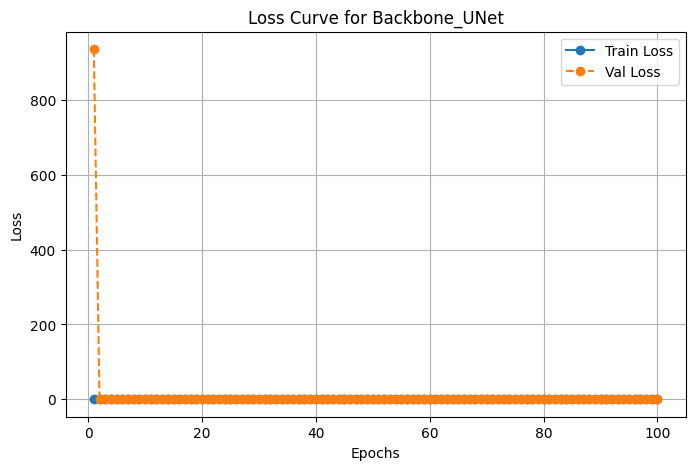

Checkpoint Loaded: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 98, Best Metric: 0.2222


Testing:  90%|█████████ | 9/10 [00:01<00:00,  5.99it/s, Loss=0.267]


Test Loss: 0.2181, Dice Score: 0.6053


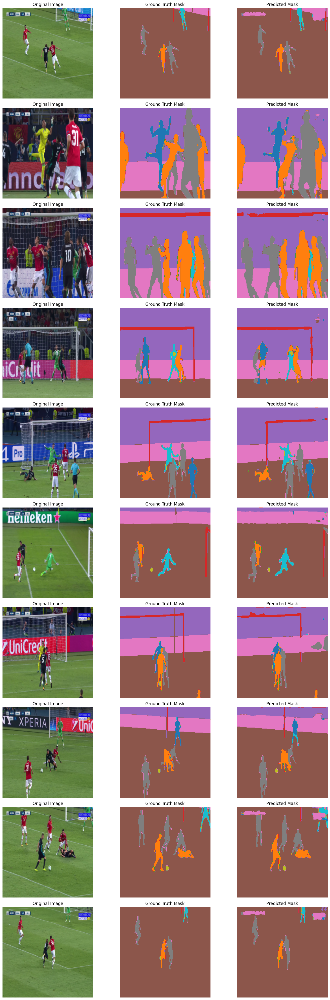

In [34]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
backbone_model = backbone_model.to(device)

params = [p for p in backbone_model.parameters() if p.requires_grad]
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(params, lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)
train_model(backbone_model, "Backbone_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(backbone_model, "Backbone_UNet", test_transformed_loader, criterion)

## 4.5 ResNet101

In [35]:
# Create U-Net model with ResNet-101 backbone
resnet101_model = smp.Unet(
    encoder_name="resnet101",      # ResNet-101 backbone
    encoder_weights="imagenet",    # Pretrained on ImageNet
    in_channels=3,                 # RGB input
    classes=11                     # 11 output classes
)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 392MB/s]


No Checkpoint Found: /kaggle/working/model_storage/ResNet101_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.42]


Epoch [1/100], Loss: 0.5009,  Dice score: 0.2687


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=4.88e+5]


Validation Loss: 598790.5781, Dice score: 0.0445

Best Validation Metric Updated: inf -> 598790.5781
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 1, Best Metric: 598790.5781


Training 2/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.46]


Epoch [2/100], Loss: 0.3849,  Dice score: 0.3943


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=6.31]


Validation Loss: 7.8058, Dice score: 0.2338

Best Validation Metric Updated: 598790.5781 -> 7.8058
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 2, Best Metric: 7.8058


Training 3/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.375]


Epoch [3/100], Loss: 0.3596,  Dice score: 0.4429


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.55it/s, Loss=0.39]


Validation Loss: 0.3868, Dice score: 0.3592

Best Validation Metric Updated: 7.8058 -> 0.3868
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 3, Best Metric: 0.3868


Training 4/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.333]


Epoch [4/100], Loss: 0.3340,  Dice score: 0.4939


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.42]


Validation Loss: 0.3986, Dice score: 0.3299



Training 5/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.337]


Epoch [5/100], Loss: 0.3264,  Dice score: 0.4967


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.395]


Validation Loss: 0.3825, Dice score: 0.3580

Best Validation Metric Updated: 0.3868 -> 0.3825
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 5, Best Metric: 0.3825


Training 6/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.305]


Epoch [6/100], Loss: 0.3141,  Dice score: 0.5193


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.353]


Validation Loss: 0.3485, Dice score: 0.4419

Best Validation Metric Updated: 0.3825 -> 0.3485
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 6, Best Metric: 0.3485


Training 7/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.286]


Epoch [7/100], Loss: 0.2992,  Dice score: 0.5707


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.447]


Validation Loss: 0.4249, Dice score: 0.3078



Training 8/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.308]


Epoch [8/100], Loss: 0.2973,  Dice score: 0.5685


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.405]


Validation Loss: 0.4033, Dice score: 0.3904



Training 9/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.246]


Epoch [9/100], Loss: 0.2857,  Dice score: 0.6004


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.699]


Validation Loss: 0.6953, Dice score: 0.2812



Training 10/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.248]


Epoch [10/100], Loss: 0.2798,  Dice score: 0.6178


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.384]


Validation Loss: 0.3728, Dice score: 0.3980

Learning Rate Updated: 0.005000 -> 0.002500


Training 11/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.252]


Epoch [11/100], Loss: 0.2630,  Dice score: 0.6681


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.314]


Validation Loss: 0.3153, Dice score: 0.5041

Best Validation Metric Updated: 0.3485 -> 0.3153
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 11, Best Metric: 0.3153


Training 12/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.248]


Epoch [12/100], Loss: 0.2515,  Dice score: 0.6695


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.331]


Validation Loss: 0.3399, Dice score: 0.4791



Training 13/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.25]


Epoch [13/100], Loss: 0.2495,  Dice score: 0.6699


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.31]


Validation Loss: 0.3101, Dice score: 0.5187

Best Validation Metric Updated: 0.3153 -> 0.3101
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 13, Best Metric: 0.3101


Training 14/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.286]


Epoch [14/100], Loss: 0.2412,  Dice score: 0.7114


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.294]


Validation Loss: 0.2945, Dice score: 0.5708

Best Validation Metric Updated: 0.3101 -> 0.2945
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 14, Best Metric: 0.2945


Training 15/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.256]


Epoch [15/100], Loss: 0.2437,  Dice score: 0.6938


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.314]


Validation Loss: 0.3195, Dice score: 0.4688



Training 16/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.226]


Epoch [16/100], Loss: 0.2487,  Dice score: 0.6735


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.304]


Validation Loss: 0.3073, Dice score: 0.5039



Training 17/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.251]


Epoch [17/100], Loss: 0.2371,  Dice score: 0.7085


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.298]


Validation Loss: 0.2952, Dice score: 0.5378



Training 18/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.238]


Epoch [18/100], Loss: 0.2374,  Dice score: 0.7080


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.277]


Validation Loss: 0.2867, Dice score: 0.5533

Best Validation Metric Updated: 0.2945 -> 0.2867
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 18, Best Metric: 0.2867


Training 19/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.238]


Epoch [19/100], Loss: 0.2318,  Dice score: 0.7176


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.289]


Validation Loss: 0.2960, Dice score: 0.5167



Training 20/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.205]


Epoch [20/100], Loss: 0.2322,  Dice score: 0.7056


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.299]


Validation Loss: 0.3059, Dice score: 0.5226



Training 21/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.195]


Epoch [21/100], Loss: 0.2270,  Dice score: 0.7356


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.282]


Validation Loss: 0.2883, Dice score: 0.5428



Training 22/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.223]


Epoch [22/100], Loss: 0.2211,  Dice score: 0.7488


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.327]


Validation Loss: 0.3201, Dice score: 0.4966

Learning Rate Updated: 0.002500 -> 0.001250


Training 23/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.183]


Epoch [23/100], Loss: 0.2229,  Dice score: 0.7546


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.252]


Validation Loss: 0.2634, Dice score: 0.6019

Best Validation Metric Updated: 0.2867 -> 0.2634
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 23, Best Metric: 0.2634


Training 24/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.231]


Epoch [24/100], Loss: 0.2149,  Dice score: 0.7591


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.267]


Validation Loss: 0.2740, Dice score: 0.5709



Training 25/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.217]


Epoch [25/100], Loss: 0.2124,  Dice score: 0.7670


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.254]


Validation Loss: 0.2642, Dice score: 0.6070



Training 26/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.254]


Epoch [26/100], Loss: 0.2109,  Dice score: 0.7584


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.27]


Validation Loss: 0.2787, Dice score: 0.5587



Training 27/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.234]


Epoch [27/100], Loss: 0.2139,  Dice score: 0.7485


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.248]


Validation Loss: 0.2617, Dice score: 0.6204

Best Validation Metric Updated: 0.2634 -> 0.2617
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 27, Best Metric: 0.2617


Training 28/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.205]


Epoch [28/100], Loss: 0.2095,  Dice score: 0.7724


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.256]


Validation Loss: 0.2635, Dice score: 0.5859



Training 29/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.224]


Epoch [29/100], Loss: 0.2105,  Dice score: 0.7601


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  2.50it/s, Loss=0.272]


Validation Loss: 0.2822, Dice score: 0.5508



Training 30/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.241]


Epoch [30/100], Loss: 0.2101,  Dice score: 0.7678


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.249]


Validation Loss: 0.2590, Dice score: 0.6146

Best Validation Metric Updated: 0.2617 -> 0.2590
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 30, Best Metric: 0.2590


Training 31/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.214]


Epoch [31/100], Loss: 0.2069,  Dice score: 0.7808


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.249]


Validation Loss: 0.2592, Dice score: 0.6168



Training 32/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.21]


Epoch [32/100], Loss: 0.2143,  Dice score: 0.7664


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.254]


Validation Loss: 0.2630, Dice score: 0.6090



Training 33/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.232]


Epoch [33/100], Loss: 0.2160,  Dice score: 0.7440


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.283]


Validation Loss: 0.2903, Dice score: 0.5656



Training 34/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.217]


Epoch [34/100], Loss: 0.2090,  Dice score: 0.7689


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=0.248]


Validation Loss: 0.2605, Dice score: 0.6043

Learning Rate Updated: 0.001250 -> 0.000625


Training 35/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.211]


Epoch [35/100], Loss: 0.2047,  Dice score: 0.7634


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.249]


Validation Loss: 0.2596, Dice score: 0.5963



Training 36/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.231]


Epoch [36/100], Loss: 0.2031,  Dice score: 0.7574


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.241]


Validation Loss: 0.2541, Dice score: 0.6293

Best Validation Metric Updated: 0.2590 -> 0.2541
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 36, Best Metric: 0.2541


Training 37/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.232]


Epoch [37/100], Loss: 0.2031,  Dice score: 0.7561


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.24]


Validation Loss: 0.2524, Dice score: 0.6281

Best Validation Metric Updated: 0.2541 -> 0.2524
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 37, Best Metric: 0.2524


Training 38/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.235]


Epoch [38/100], Loss: 0.2020,  Dice score: 0.7557


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.247]


Validation Loss: 0.2593, Dice score: 0.6048



Training 39/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.193]


Epoch [39/100], Loss: 0.2043,  Dice score: 0.7394


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.26]


Validation Loss: 0.2720, Dice score: 0.5724



Training 40/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.201]


Epoch [40/100], Loss: 0.2032,  Dice score: 0.7388


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.243]


Validation Loss: 0.2565, Dice score: 0.6189



Training 41/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.19]


Epoch [41/100], Loss: 0.2027,  Dice score: 0.7443


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.243]


Validation Loss: 0.2547, Dice score: 0.6313

Learning Rate Updated: 0.000625 -> 0.000313


Training 42/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.205]


Epoch [42/100], Loss: 0.1989,  Dice score: 0.7719


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.236]


Validation Loss: 0.2490, Dice score: 0.6378

Best Validation Metric Updated: 0.2524 -> 0.2490
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 42, Best Metric: 0.2490


Training 43/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.194]


Epoch [43/100], Loss: 0.1968,  Dice score: 0.7648


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.237]


Validation Loss: 0.2480, Dice score: 0.6525

Best Validation Metric Updated: 0.2490 -> 0.2480
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 43, Best Metric: 0.2480


Training 44/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.219]


Epoch [44/100], Loss: 0.1975,  Dice score: 0.7662


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.234]


Validation Loss: 0.2466, Dice score: 0.6489

Best Validation Metric Updated: 0.2480 -> 0.2466
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 44, Best Metric: 0.2466


Training 45/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.178]


Epoch [45/100], Loss: 0.1935,  Dice score: 0.7701


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.23]


Validation Loss: 0.2446, Dice score: 0.6672

Best Validation Metric Updated: 0.2466 -> 0.2446
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 45, Best Metric: 0.2446


Training 46/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.243]


Epoch [46/100], Loss: 0.1961,  Dice score: 0.7723


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.226]


Validation Loss: 0.2420, Dice score: 0.6761

Best Validation Metric Updated: 0.2446 -> 0.2420
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 46, Best Metric: 0.2420


Training 47/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.193]


Epoch [47/100], Loss: 0.1959,  Dice score: 0.7818


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.228]


Validation Loss: 0.2421, Dice score: 0.6834



Training 48/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.198]


Epoch [48/100], Loss: 0.1929,  Dice score: 0.7941


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.227]


Validation Loss: 0.2407, Dice score: 0.6878

Best Validation Metric Updated: 0.2420 -> 0.2407
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 48, Best Metric: 0.2407


Training 49/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.177]


Epoch [49/100], Loss: 0.1926,  Dice score: 0.7979


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.227]


Validation Loss: 0.2413, Dice score: 0.6844



Training 50/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.128]


Epoch [50/100], Loss: 0.1924,  Dice score: 0.7824


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.231]


Validation Loss: 0.2437, Dice score: 0.6710



Training 51/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.184]


Epoch [51/100], Loss: 0.1915,  Dice score: 0.7865


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s, Loss=0.228]


Validation Loss: 0.2412, Dice score: 0.6928



Training 52/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.197]


Epoch [52/100], Loss: 0.1927,  Dice score: 0.7737


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.228]


Validation Loss: 0.2416, Dice score: 0.6749

Learning Rate Updated: 0.000313 -> 0.000156


Training 53/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.199]


Epoch [53/100], Loss: 0.1906,  Dice score: 0.7860


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.229]


Validation Loss: 0.2404, Dice score: 0.6973

Best Validation Metric Updated: 0.2407 -> 0.2404
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 53, Best Metric: 0.2404


Training 54/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.206]


Epoch [54/100], Loss: 0.1906,  Dice score: 0.8019


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.224]


Validation Loss: 0.2383, Dice score: 0.6939

Best Validation Metric Updated: 0.2404 -> 0.2383
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 54, Best Metric: 0.2383


Training 55/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.2]


Epoch [55/100], Loss: 0.1889,  Dice score: 0.8068


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.223]


Validation Loss: 0.2372, Dice score: 0.6960

Best Validation Metric Updated: 0.2383 -> 0.2372
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 55, Best Metric: 0.2372


Training 56/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.187]


Epoch [56/100], Loss: 0.1894,  Dice score: 0.8028


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.224]


Validation Loss: 0.2381, Dice score: 0.6989



Training 57/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.201]


Epoch [57/100], Loss: 0.1890,  Dice score: 0.7934


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.225]


Validation Loss: 0.2383, Dice score: 0.7003



Training 58/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.177]


Epoch [58/100], Loss: 0.1889,  Dice score: 0.7956


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.224]


Validation Loss: 0.2379, Dice score: 0.7000



Training 59/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.191]


Epoch [59/100], Loss: 0.1883,  Dice score: 0.8135


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.223]


Validation Loss: 0.2371, Dice score: 0.6978

Learning Rate Updated: 0.000156 -> 0.000078
Best Validation Metric Updated: 0.2372 -> 0.2371
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 59, Best Metric: 0.2371


Training 60/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.181]


Epoch [60/100], Loss: 0.1882,  Dice score: 0.8024


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  2.61it/s, Loss=0.224]


Validation Loss: 0.2371, Dice score: 0.7037

Best Validation Metric Updated: 0.2371 -> 0.2371
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 60, Best Metric: 0.2371


Training 61/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.174]


Epoch [61/100], Loss: 0.1890,  Dice score: 0.7999


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.224]


Validation Loss: 0.2379, Dice score: 0.7002



Training 62/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.169]


Epoch [62/100], Loss: 0.1875,  Dice score: 0.7923


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.222]


Validation Loss: 0.2360, Dice score: 0.7041

Best Validation Metric Updated: 0.2371 -> 0.2360
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 62, Best Metric: 0.2360


Training 63/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.188]


Epoch [63/100], Loss: 0.1889,  Dice score: 0.8015


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.222]


Validation Loss: 0.2364, Dice score: 0.7040



Training 64/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.182]


Epoch [64/100], Loss: 0.1871,  Dice score: 0.8091


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.222]


Validation Loss: 0.2357, Dice score: 0.7050

Best Validation Metric Updated: 0.2360 -> 0.2357
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 64, Best Metric: 0.2357


Training 65/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.205]


Epoch [65/100], Loss: 0.1848,  Dice score: 0.8134


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.222]


Validation Loss: 0.2357, Dice score: 0.7044

Best Validation Metric Updated: 0.2357 -> 0.2357
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 65, Best Metric: 0.2357


Training 66/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.216]


Epoch [66/100], Loss: 0.1849,  Dice score: 0.8267


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s, Loss=0.221]


Validation Loss: 0.2350, Dice score: 0.7042

Best Validation Metric Updated: 0.2357 -> 0.2350
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 66, Best Metric: 0.2350


Training 67/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.181]


Epoch [67/100], Loss: 0.1866,  Dice score: 0.8075


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.223]


Validation Loss: 0.2366, Dice score: 0.7055



Training 68/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.148]


Epoch [68/100], Loss: 0.1850,  Dice score: 0.8167


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s, Loss=0.221]


Validation Loss: 0.2351, Dice score: 0.7072



Training 69/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.194]


Epoch [69/100], Loss: 0.1840,  Dice score: 0.8168


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.222]


Validation Loss: 0.2351, Dice score: 0.7082



Training 70/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.155]


Epoch [70/100], Loss: 0.1857,  Dice score: 0.8073


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.221]


Validation Loss: 0.2344, Dice score: 0.7106

Best Validation Metric Updated: 0.2350 -> 0.2344
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 70, Best Metric: 0.2344


Training 71/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.155]


Epoch [71/100], Loss: 0.1855,  Dice score: 0.8145


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.219]


Validation Loss: 0.2339, Dice score: 0.7143

Best Validation Metric Updated: 0.2344 -> 0.2339
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 71, Best Metric: 0.2339


Training 72/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.205]


Epoch [72/100], Loss: 0.1840,  Dice score: 0.7996


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.223]


Validation Loss: 0.2356, Dice score: 0.7129



Training 73/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.211]


Epoch [73/100], Loss: 0.1866,  Dice score: 0.7905


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.222]


Validation Loss: 0.2358, Dice score: 0.7042



Training 74/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.185]


Epoch [74/100], Loss: 0.1846,  Dice score: 0.8090


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.221]


Validation Loss: 0.2342, Dice score: 0.7156



Training 75/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.19]


Epoch [75/100], Loss: 0.1863,  Dice score: 0.8025


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s, Loss=0.223]


Validation Loss: 0.2354, Dice score: 0.7167

Learning Rate Updated: 0.000078 -> 0.000039


Training 76/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.204]


Epoch [76/100], Loss: 0.1861,  Dice score: 0.8054


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  2.60it/s, Loss=0.224]


Validation Loss: 0.2358, Dice score: 0.7160



Training 77/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.203]


Epoch [77/100], Loss: 0.1831,  Dice score: 0.8295


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.222]


Validation Loss: 0.2346, Dice score: 0.7186



Training 78/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.205]


Epoch [78/100], Loss: 0.1834,  Dice score: 0.8263


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.222]


Validation Loss: 0.2343, Dice score: 0.7185



Training 79/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.152]


Epoch [79/100], Loss: 0.1832,  Dice score: 0.8240


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.222]


Validation Loss: 0.2346, Dice score: 0.7173

Learning Rate Updated: 0.000039 -> 0.000020


Training 80/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.192]


Epoch [80/100], Loss: 0.1845,  Dice score: 0.8109


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.221]


Validation Loss: 0.2343, Dice score: 0.7175



Training 81/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.188]


Epoch [81/100], Loss: 0.1846,  Dice score: 0.8189


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.222]


Validation Loss: 0.2343, Dice score: 0.7179



Training 82/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.169]


Epoch [82/100], Loss: 0.1872,  Dice score: 0.8017


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.221]


Validation Loss: 0.2341, Dice score: 0.7177



Training 83/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.188]


Epoch [83/100], Loss: 0.1832,  Dice score: 0.8247


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.221]


Validation Loss: 0.2343, Dice score: 0.7185

Learning Rate Updated: 0.000020 -> 0.000010


Training 84/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.207]


Epoch [84/100], Loss: 0.1837,  Dice score: 0.8290


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.221]


Validation Loss: 0.2340, Dice score: 0.7196



Training 85/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.176]


Epoch [85/100], Loss: 0.1818,  Dice score: 0.8287


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.221]


Validation Loss: 0.2339, Dice score: 0.7197



Training 86/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.18]


Epoch [86/100], Loss: 0.1849,  Dice score: 0.8068


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.221]


Validation Loss: 0.2340, Dice score: 0.7185



Training 87/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.16]


Epoch [87/100], Loss: 0.1843,  Dice score: 0.8299


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.221]


Validation Loss: 0.2341, Dice score: 0.7190

Learning Rate Updated: 0.000010 -> 0.000005


Training 88/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.205]


Epoch [88/100], Loss: 0.1825,  Dice score: 0.8167


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.22]


Validation Loss: 0.2336, Dice score: 0.7190

Best Validation Metric Updated: 0.2339 -> 0.2336
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 88, Best Metric: 0.2336


Training 89/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.192]


Epoch [89/100], Loss: 0.1831,  Dice score: 0.8325


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.221]


Validation Loss: 0.2337, Dice score: 0.7178



Training 90/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.139]


Epoch [90/100], Loss: 0.1826,  Dice score: 0.8040


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.221]


Validation Loss: 0.2337, Dice score: 0.7184



Training 91/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.19]


Epoch [91/100], Loss: 0.1852,  Dice score: 0.8178


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.221]


Validation Loss: 0.2336, Dice score: 0.7206

Best Validation Metric Updated: 0.2336 -> 0.2336
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 91, Best Metric: 0.2336


Training 92/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.165]


Epoch [92/100], Loss: 0.1824,  Dice score: 0.8253


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.221]


Validation Loss: 0.2336, Dice score: 0.7203

Learning Rate Updated: 0.000005 -> 0.000002


Training 93/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.183]


Epoch [93/100], Loss: 0.1846,  Dice score: 0.8129


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s, Loss=0.221]


Validation Loss: 0.2337, Dice score: 0.7199



Training 94/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.211]


Epoch [94/100], Loss: 0.1821,  Dice score: 0.8253


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.221]


Validation Loss: 0.2336, Dice score: 0.7196



Training 95/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.181]


Epoch [95/100], Loss: 0.1822,  Dice score: 0.8350


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.22]


Validation Loss: 0.2333, Dice score: 0.7206

Best Validation Metric Updated: 0.2336 -> 0.2333
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 95, Best Metric: 0.2333


Training 96/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.176]


Epoch [96/100], Loss: 0.1836,  Dice score: 0.8299


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s, Loss=0.221]


Validation Loss: 0.2340, Dice score: 0.7196



Training 97/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.162]


Epoch [97/100], Loss: 0.1807,  Dice score: 0.8297


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.221]


Validation Loss: 0.2336, Dice score: 0.7210



Training 98/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.177]


Epoch [98/100], Loss: 0.1819,  Dice score: 0.8233


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  2.49it/s, Loss=0.221]


Validation Loss: 0.2336, Dice score: 0.7211



Training 99/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.197]


Epoch [99/100], Loss: 0.1822,  Dice score: 0.8094


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.22]


Validation Loss: 0.2334, Dice score: 0.7212

Learning Rate Updated: 0.000002 -> 0.000001


Training 100/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.185]


Epoch [100/100], Loss: 0.1822,  Dice score: 0.8187


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.22]


Validation Loss: 0.2331, Dice score: 0.7208

Best Validation Metric Updated: 0.2333 -> 0.2331
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 100, Best Metric: 0.2331


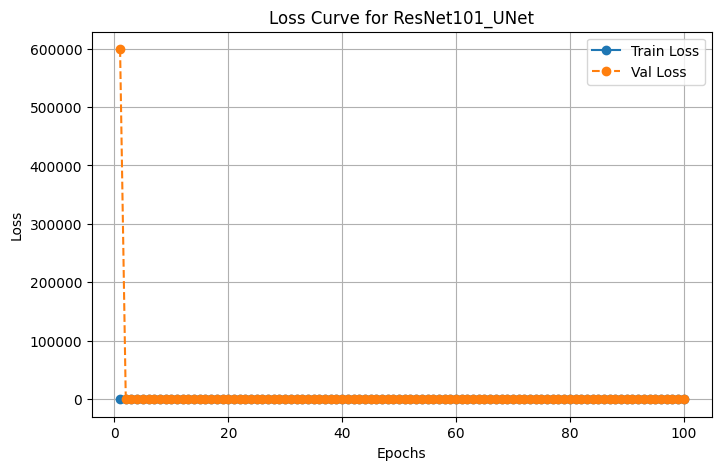

Checkpoint Loaded: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 100, Best Metric: 0.2331


Testing:  90%|█████████ | 9/10 [00:01<00:00,  5.55it/s, Loss=0.294]


Test Loss: 0.2308, Dice Score: 0.5627


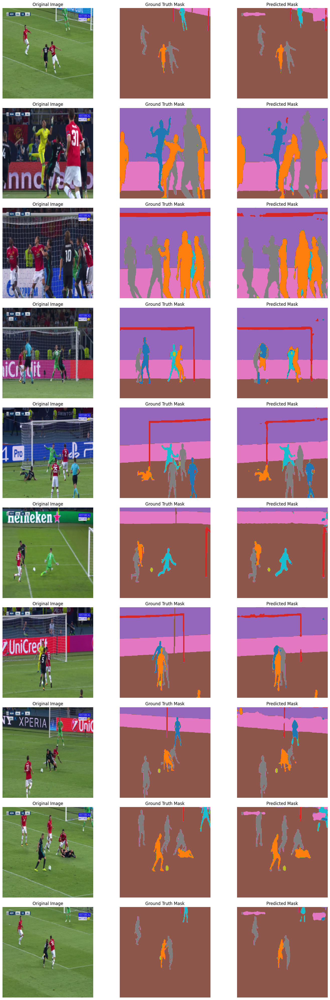

In [36]:
# Model training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet101_model = resnet101_model.to(device)

# Only train learnable parameters
params = [p for p in resnet101_model.parameters() if p.requires_grad]

num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(params, lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)

train_model(resnet101_model, "ResNet101_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(resnet101_model, "ResNet101_UNet", test_transformed_loader, criterion)